<a href="https://colab.research.google.com/github/ligtexpe45/LoanApprovalML/blob/main/ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Imports

In [ ]:
!pip install kmodes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
import seaborn as sns
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,cross_val_score,KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score
from pandas.plotting import scatter_matrix
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import davies_bouldin_score, silhouette_samples
from sklearn.preprocessing import MinMaxScaler
from sklearn import feature_selection
from scipy.stats import pointbiserialr
from scipy.stats import gaussian_kde
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import make_pipeline
import scipy.cluster.hierarchy as shc

#Loan Dataset Properties

##Data Description


### Loan-Approval-Prediction-Dataset
The loan approval dataset is a collection of financial records and associated information used to determine the eligibility of individuals or organizations for obtaining loans from a lending institution. It includes various factors such as cibil score, income, employment status, loan term, loan amount, assets value, and loan status.

### Dataset Features/Columns

1. **loan_id**: A unique identifier for each loan record, represented as an integer.

2. **no_of_dependents**: The number of dependents associated with the loan applicant, expressed as an integer.

3. **education**: The education level of the loan applicant, categorized as either "Graduate" or "Not Graduate."

4. **self_employed**: A categorical indicator denoting whether the loan applicant is self-employed, with options "Yes" or "No."

5. **income_annum**: The annual income of the loan applicant, recorded as an integer.

6. **loan_amount**: The requested loan amount in monetary units, specified as an integer.

7. **loan_term**: The duration of the loan in months, presented as an integer.

8. **cibil_score**: The Credit Information Bureau India Limited (CIBIL) score, representing the creditworthiness of the loan applicant and recorded as an integer.

9. **residential_assets_value**: The value of residential assets owned by the loan applicant, measured in monetary units and expressed as an integer.

10. **commercial_assets_value**: The value of commercial assets owned by the loan applicant, denoted in monetary units and recorded as an integer.

11. **luxury_assets_value**: The value of luxury assets owned by the loan applicant, expressed in monetary units and represented as an integer.

12. **bank_asset_value**: The value of assets held by the loan applicant in the bank, indicated in monetary units and recorded as an integer.

13. **loan_status**: The final decision on the loan application, categorized as either "Approved" or "Rejected."

###Loading Dataset

 The following code cell loads the loan approval dataset from a CSV file and performs preprocessing steps to clean up the column names and remove the empty spaces from it.

In [ ]:
loan_raw=pd.read_csv('/content/loan_approval_dataset.csv')
loan_raw.columns = loan_raw.columns.str.strip()

## Dataset Overview

In [ ]:
loan_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   loan_id                   4269 non-null   int64 
 1   no_of_dependents          4269 non-null   int64 
 2   education                 4269 non-null   object
 3   self_employed             4269 non-null   object
 4   income_annum              4269 non-null   int64 
 5   loan_amount               4269 non-null   int64 
 6   loan_term                 4269 non-null   int64 
 7   cibil_score               4269 non-null   int64 
 8   residential_assets_value  4269 non-null   int64 
 9   commercial_assets_value   4269 non-null   int64 
 10  luxury_assets_value       4269 non-null   int64 
 11  bank_asset_value          4269 non-null   int64 
 12  loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [ ]:
loan_raw.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [ ]:
loan_raw.tail()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
4264,4265,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected
4265,4266,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved
4266,4267,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected
4267,4268,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved
4268,4269,1,Graduate,No,9200000,29700000,10,607,17800000,11800000,35700000,12000000,Approved


## Dataset Size

In [ ]:
loan_raw.shape

(4269, 13)

## Dataset *Features*

In [ ]:
loan_raw.columns

Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status'],
      dtype='object')

## Descriptive Statistics

In [ ]:
loan_raw.describe()

,loan_id,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03
mean,2135.000000,2.498712,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06
std,1232.498479,1.695910,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06
min,1.000000,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00
25%,1068.000000,1.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06
50%,2135.000000,3.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06
75%,3202.000000,4.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06
max,4269.000000,5.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07


In [ ]:
loan_raw.skew()

<ipython-input-163-73a3913c512c>:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  loan_raw.skew()


loan_id                     0.000000
no_of_dependents           -0.017971
income_annum               -0.012814
loan_amount                 0.308724
loan_term                   0.036359
cibil_score                -0.009039
residential_assets_value    0.978451
commercial_assets_value     0.957791
luxury_assets_value         0.322208
bank_asset_value            0.560725
dtype: float64

##Data *Visualization*

## histogram

array([[<Axes: title={'center': 'loan_id'}>,
        <Axes: title={'center': 'no_of_dependents'}>,
        <Axes: title={'center': 'income_annum'}>],
       [<Axes: title={'center': 'loan_amount'}>,
        <Axes: title={'center': 'loan_term'}>,
        <Axes: title={'center': 'cibil_score'}>],
       [<Axes: title={'center': 'residential_assets_value'}>,
        <Axes: title={'center': 'commercial_assets_value'}>,
        <Axes: title={'center': 'luxury_assets_value'}>],
       [<Axes: title={'center': 'bank_asset_value'}>, <Axes: >, <Axes: >]],
      dtype=object)

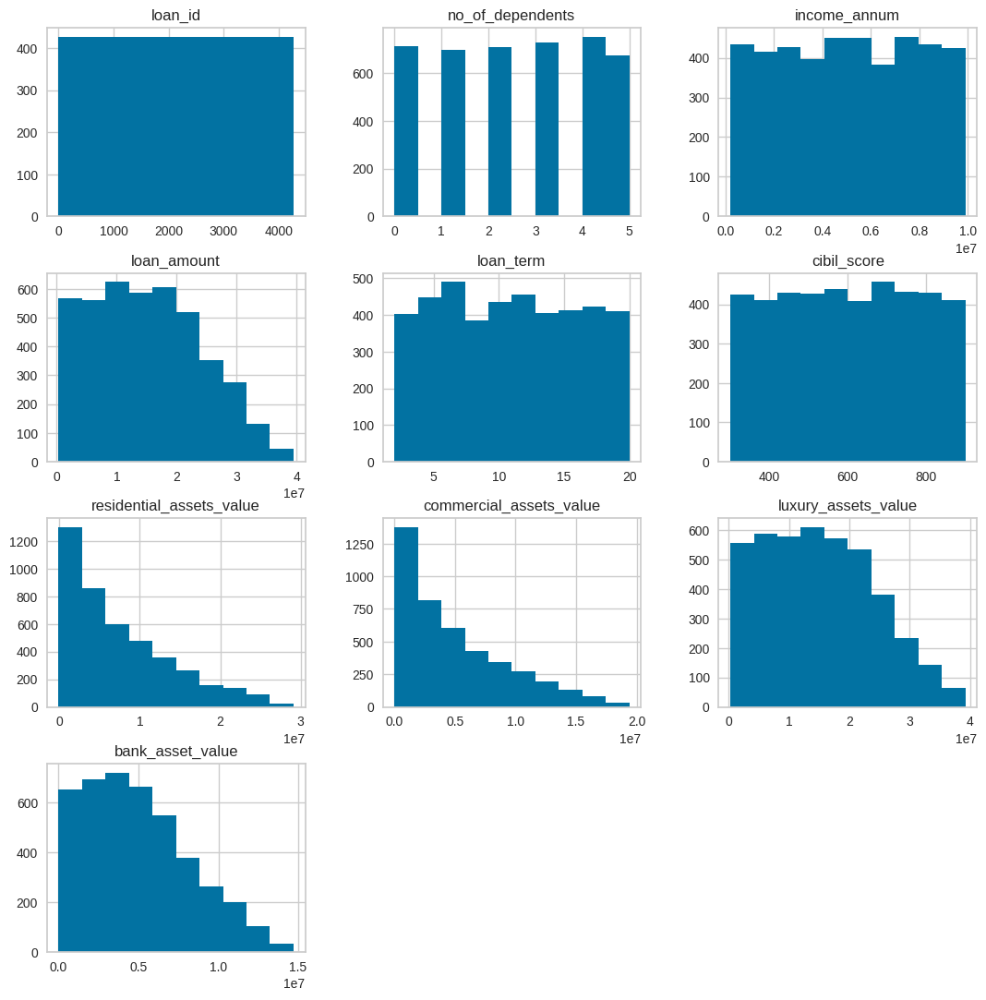

In [ ]:
# Display histograms for each column in the raw loan dataframe
loan_raw.hist(figsize=(13,13))

## Box Plot

This cell generates box plots for each column in the dataset, displaying the summary statistics such as minimum, first quartile, median, third quartile, and maximum. This helps identify outliers and the overall distribution of each feature.

loan_id                        Axes(0.125,0.747241;0.227941x0.132759)
no_of_dependents            Axes(0.398529,0.747241;0.227941x0.132759)
income_annum                Axes(0.672059,0.747241;0.227941x0.132759)
loan_amount                    Axes(0.125,0.587931;0.227941x0.132759)
loan_term                   Axes(0.398529,0.587931;0.227941x0.132759)
cibil_score                 Axes(0.672059,0.587931;0.227941x0.132759)
residential_assets_value       Axes(0.125,0.428621;0.227941x0.132759)
commercial_assets_value     Axes(0.398529,0.428621;0.227941x0.132759)
luxury_assets_value         Axes(0.672059,0.428621;0.227941x0.132759)
bank_asset_value                Axes(0.125,0.26931;0.227941x0.132759)
dtype: object

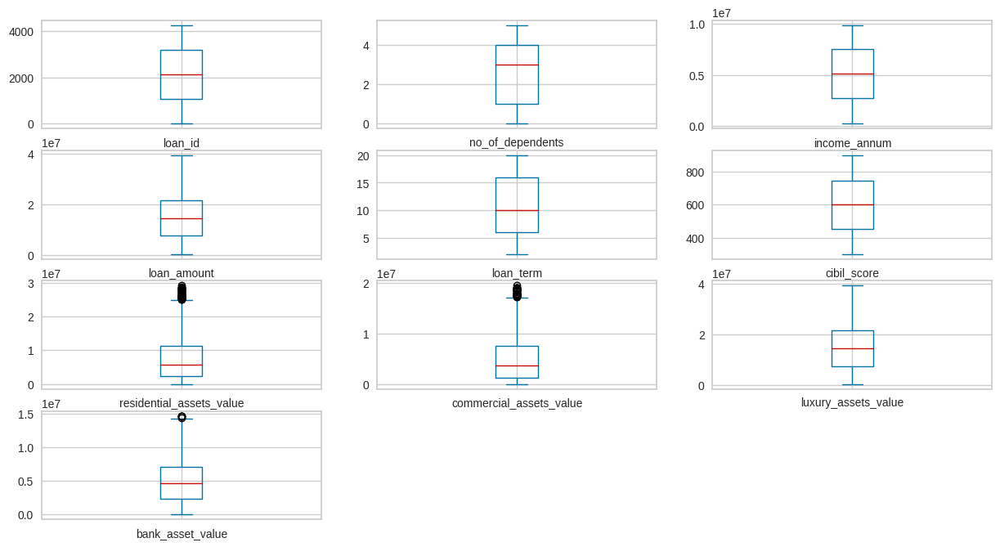

In [ ]:
# Display box plots for each column in the raw loan dataframe
loan_raw.plot(kind='box', subplots=True, sharex=False, sharey=False, layout=(5,3), figsize=(15,10))

## Density Plot

This cell produces density plots for each column, giving an estimate of the probability distribution of each feature. This can be useful for understanding the shape of the data distribution.

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>]], dtype=object)

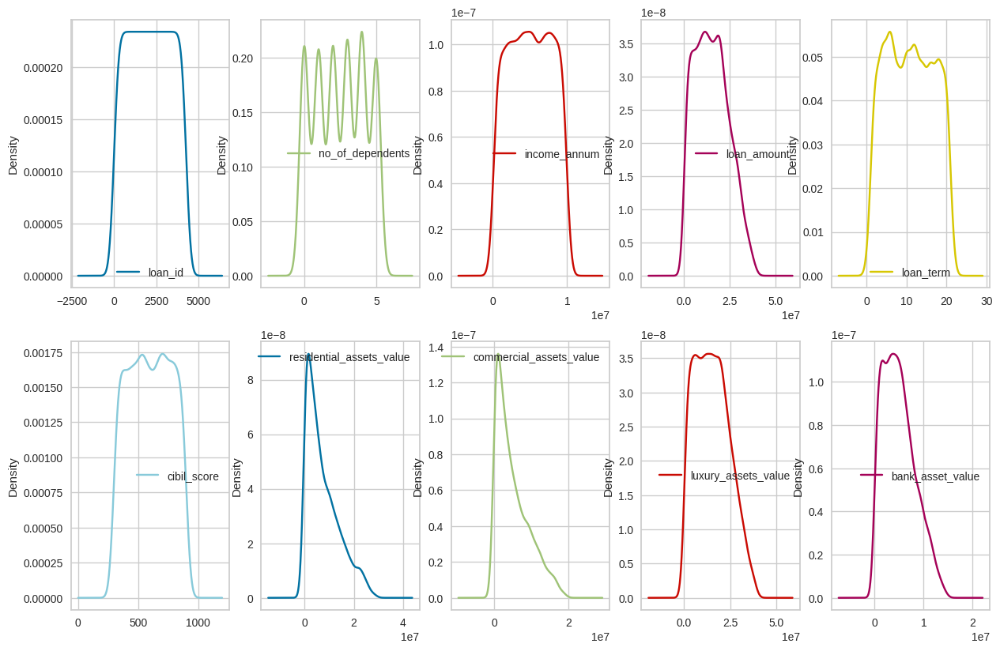

In [ ]:
# Display density plots for each column in the raw loan dataframe
loan_raw.plot(kind='density', subplots=True, layout=(3,5), sharex=False,figsize=(15,15))

## Scatter Matrix

This cell creates a scatter matrix, displaying scatter plots for all pairs of features in the dataset. This is useful for identifying relationships or patterns between different features.

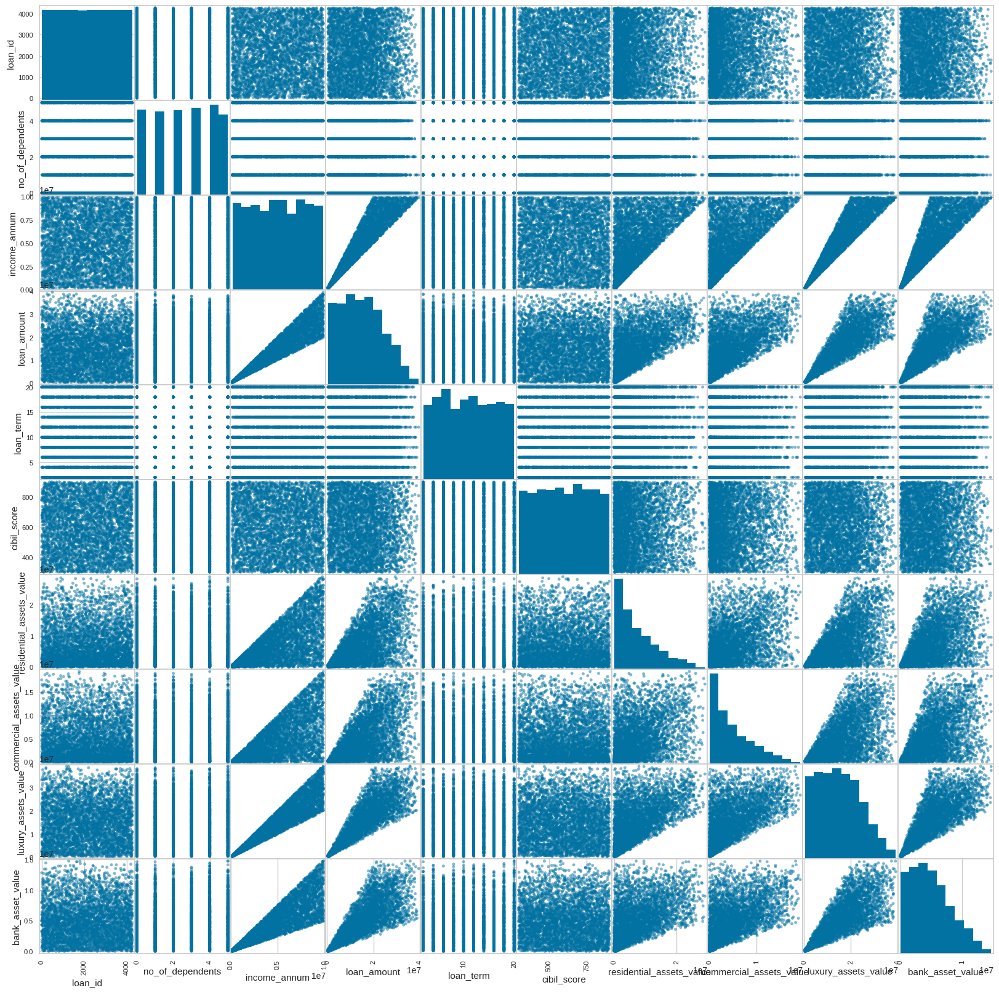

In [ ]:
# Display scatter matrix for all pairs of features in the raw loan dataframe
scatter_matrix(loan_raw, figsize=(20,20))
plt.show()

## Correlation Matrix Heatmap

This cell calculates the correlation matrix for the features in the raw loan DataFrame. Then a heatmap is created using the calculated correlation matrix.
<br>This visualization is useful for understanding the coorelation between different features in the dataset. Positive values indicate a positive correlation, negative values indicate a negative correlation, and values close to zero suggest a weak correlation.

<ipython-input-168-2e08fcbed997>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = loan_raw.corr()


                           loan_id  no_of_dependents  income_annum  \
loan_id                   1.000000          0.005326      0.012592   
no_of_dependents          0.005326          1.000000      0.007266   
income_annum              0.012592          0.007266      1.000000   
loan_amount               0.008170         -0.003366      0.927470   
loan_term                 0.009809         -0.020111      0.011488   
cibil_score               0.016323         -0.009998     -0.023034   
residential_assets_value  0.020936          0.007376      0.636841   
commercial_assets_value   0.018595         -0.001531      0.640328   
luxury_assets_value      -0.000862          0.002817      0.929145   
bank_asset_value          0.010765          0.011163      0.851093   

                          loan_amount  loan_term  cibil_score  \
loan_id                      0.008170   0.009809     0.016323   
no_of_dependents            -0.003366  -0.020111    -0.009998   
income_annum                 0.927

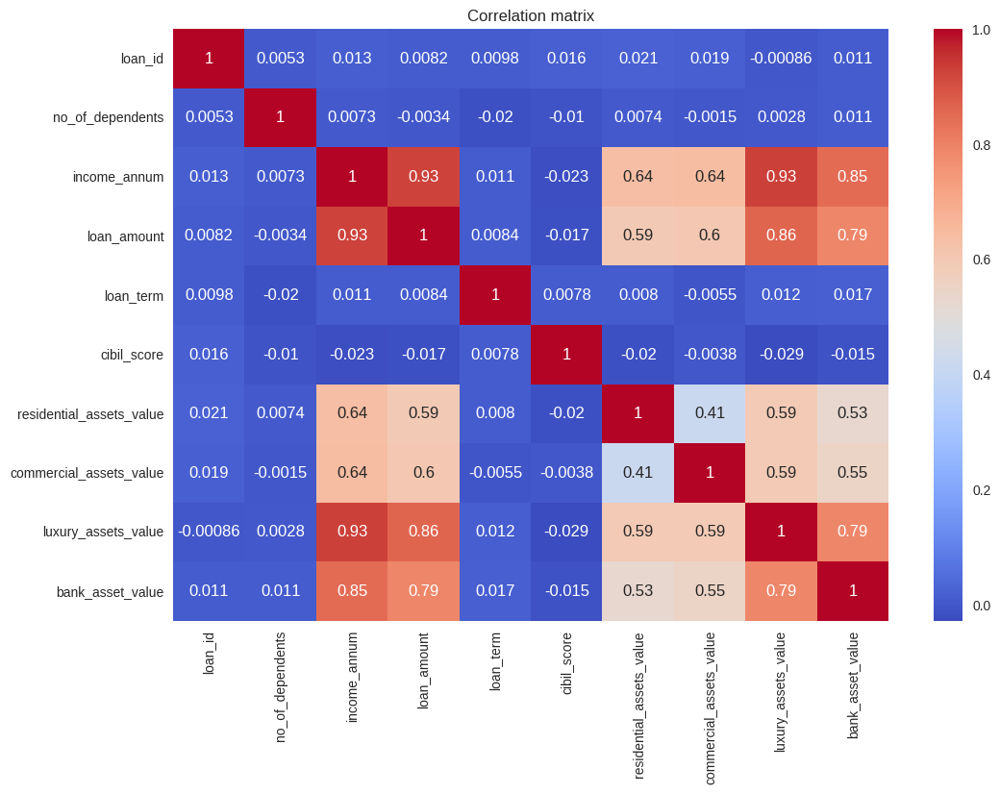

In [ ]:
# Calculate the correlation matrix for the features in loan_raw
correlation_matrix = loan_raw.corr()
print(correlation_matrix)
plt.figure(figsize=(12, 8))
# Create a heatmap with correlation values
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

## Dataset Overview and Key Findings

The loan approval dataset comprises 4269 entries with 13 columns, encompassing both numerical (int64) and categorical (object) data types.

### Descriptive Statistics

1. **Numerical Features:** The numerical features in the dataset exhibit diverse ranges and measuring units, reflecting the varied nature of financial and credit-related metrics.

   - `no_of_dependents` has a mean of approximately 2.5 with a standard deviation of 1.7.
   - `income_annum` averages around 5.06 million with a standard deviation of about 2.81 million.
   - `loan_amount` ranges from 300,000 to 39.5 million with a mean of 15.13 million.
   - `loan_term` has a mean of 10.9 months.
   - `cibil_score` spans from 300 to 900, with a mean of 599.94.

  These variations in ranges and units underscore the importance of standardization when applying regression algorithms to ensure fair comparisons and accurate model training.
### Skewness

2. **Skewness Insights:**
   - Positive skewness observed in `residential_assets_value` and `commercial_assets_value`.
   - `luxury_assets_value` and `bank_asset_value` also exhibit positive skewness.

### Correlation Matrix

3. **Correlation Relationships:**
   - Strong positive correlation between `loan_amount` and both `income_annum` and `bank_asset_value`.
   - Moderate positive correlation between `loan_amount` and both `residential_assets_value` and `commercial_assets_value`.

### Additional Notes

4. **Additional Observations:**
   - Preprocessing steps, such as handling missing values, seem to have been performed.
   -The analysis reveals potential for feature engineering, including the creation of binary indicators for categorical variables like education (for instance, introducing an "IsGraduate" indicator).



#Regression Pipeline

##Testing different models on raw data
In the following cells, we perform a comprehensive analysis of different machine learning models using the raw data. The dataset consists of various features, and the target variable is 'loan_amount'. Before any preprocessing or feature engineering, the models are trained and evaluated directly on the raw dataset. This analysis serves as an initial exploration before further preprocessing steps.

####Linear Regression
Fits a linear regression model to the training data, predicts on the test data, and evaluates the model using Mean Absolute Error, Mean Squared Error, and R-squared.

In [ ]:
# Separate target variable and features
loan_target=loan_raw['loan_amount']
loan_data=loan_raw.drop(['loan_amount','education','self_employed','loan_status'],axis=1)
# Set random seed for reproducibility
np.random.seed(42)
# Split the data into training and testing sets
X_train,X_test,Y_train,Y_test =train_test_split(loan_data,loan_target)
# Linear Regression
linear_reg=LinearRegression()
linear_reg.fit(X_train,Y_train)
predictions = linear_reg.predict(X_test)
print("Coefficients:", linear_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =linear_reg.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-3.90232878e+01 -4.65700519e+04  3.06760596e+00  1.04193164e+03
  2.70899701e+02 -5.25393425e-03  2.20812467e-02 -2.03067093e-02
 -2.75742531e-02 -3.42679071e+04]
Mean Absolute Error (MAE): 2588884.493368654
Mean Squared Error (MSE): 11590619003009.592
Root Mean Squared Error (RMSE): 3404499.816861442
R-Squared (R2): 0.8539680545865707


###Ridge Regression
Applies Ridge regression, similar to linear regression, but with regularization to handle multicollinearity.

In [ ]:
# Ridge Regression
ridge=linear_model.Ridge()
ridge.fit(X_train,Y_train)
predictions = ridge.predict(X_test)
print("Coefficients:", ridge.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =ridge.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-3.90237928e+01 -4.65649652e+04  3.06760607e+00  1.04199376e+03
  2.70901379e+02 -5.25392784e-03  2.20812914e-02 -2.03067455e-02
 -2.75744006e-02 -3.42251135e+04]
Mean Absolute Error (MAE): 2588883.8481673333
Mean Squared Error (MSE): 11590616856168.105
Root Mean Squared Error (RMSE): 3404499.501566729
R-Squared (R2): 0.8539680816349482


###Lasso Regression
Applies Lasso regression, another type of linear regression with L1 regularization.

In [ ]:
# Lasso Regression
lasso=linear_model.Lasso()
lasso.fit(X_train,Y_train)
predictions = ridge.predict(X_test)
print("Coefficients:", lasso.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =lasso.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-3.90233306e+01 -4.65697038e+04  3.06760598e+00  1.04190727e+03
  2.70899821e+02 -5.25393399e-03  2.20812497e-02 -2.03067132e-02
 -2.75742639e-02 -3.42639092e+04]
Mean Absolute Error (MAE): 2588883.8481673333
Mean Squared Error (MSE): 11590616856168.105
Root Mean Squared Error (RMSE): 3404499.501566729
R-Squared (R2): 0.8539680578049769


###ElasticNet Regression
Applies ElasticNet regression, which combines L1 and L2 regularization.

In [ ]:
# ElasticNet Regression
elastic=linear_model.ElasticNet()
elastic.fit(X_train,Y_train)
predictions = elastic.predict(X_test)
print("Coefficients:", elastic.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =elastic.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-3.93744892e+01 -3.96293913e+04  3.06766182e+00  1.07891983e+03
  2.72226191e+02 -5.24563715e-03  2.21211335e-02 -2.03106328e-02
 -2.77200118e-02 -1.14235003e+04]
Mean Absolute Error (MAE): 2588430.6537536564
Mean Squared Error (MSE): 11590444604029.65
Root Mean Squared Error (RMSE): 3404474.2037544725
R-Squared (R2): 0.8539702518654488


###Polynomial Regression
Applies polynomial regression with degree 2, transforming the features to include polynomial terms and then fitting a linear regression model.

In [ ]:
# Polynomial Regression (Degree = 2)
degree = 2
# Generating polynomial features

poly_features = PolynomialFeatures(degree=degree, include_bias=False)
# fits the PolynomialFeatures instance to the training data and transforms it
X_train_poly = poly_features.fit_transform(X_train)
#  transforms the test data using the same polynomial features that were generated from the training data.
X_test_poly = poly_features.transform(X_test)
# Linear Regression with Polynomial Features
reg=LinearRegression()
reg.fit(X_train_poly,Y_train)
predictions = reg.predict(X_test_poly)
print("Coefficients:", reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =reg.score(X_test_poly,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-1.75394444e+02  3.97151881e+05  2.70473053e+00  5.86035332e+04
  3.01961686e+03 -1.00151375e-02 -1.39176091e-01  1.28914422e-01
  1.36136094e-01 -4.61492604e+05  9.60307604e-03 -1.10134837e+01
  2.04824983e-05  1.34570920e+01 -3.72084646e-02  1.41591424e-06
  3.06374645e-06 -1.09873574e-05  1.08601672e-06  7.21106007e+01
 -4.46193893e+04 -1.51835007e-01  3.21611153e+03 -3.63768122e+02
 -7.80480562e-03  2.19903613e-02  4.11173748e-02  7.49577647e-03
  5.05677464e+04  1.67324250e-07  2.15162145e-02 -1.12313765e-04
  8.21935742e-10 -5.32600097e-09 -5.51663106e-08 -1.05152139e-07
 -1.86235922e-02 -3.20362398e+03 -5.04920194e+01  5.40552042e-04
  8.21913723e-04 -8.07227585e-03 -2.85954115e-03  4.67013776e+04
 -1.56705274e+00  1.99205351e-05 -7.30260581e-07 -2.32751190e-05
  2.99349365e-04 -4.51154630e+01 -1.55705493e-09  8.32369551e-09
 -3.57977115e-09  2.44472176e-09  6.73667470e-02 -9.02218744e-10
  1.00699253e-08 -2.15659384e-08 -2.45911551e-02  3.43425199e-09
  1.5847035

**Overall Evaluation**:
All models (linear, Ridge, Lasso, ElasticNet, polynomial) seem to perform similarly in terms of MAE, MSE, and R2. The models achieve a reasonably high R2 score, suggesting that they capture a substantial amount of variance in the target variable.

##Data Cleaning and preprocessing
In this section, we conducted comprehensive data cleaning and preprocessing steps on the raw loan dataset. The primary goal was to prepare the data for subsequent modeling by addressing issues such as transforming categorical variables into a usable format, handling outliers, and removing duplicate rows.

**Binary Columns**: IsGraduate, self_employed, and loan_approved are created based on the mapping of categorical values to binary values to be usable in regression models.

In [ ]:
loan_cleaned=loan_raw
# Create a binary column 'IsGraduate' based on the 'education' column
loan_cleaned['IsGraduate'] = loan_cleaned['education'].map({' Graduate': 1, ' Not Graduate': 0})
print(loan_cleaned['IsGraduate'])
# Drop the original 'education' column
loan_cleaned = loan_cleaned.drop('education', axis=1)
# Map 'self_employed' to binary values
loan_cleaned['self_employed']= loan_cleaned['self_employed'].map({' Yes': 1, ' No': 0})
# Map 'loan_status' to binary values and create a new column 'loan_approved'
loan_cleaned['loan_approved'] = loan_cleaned['loan_status'].map({' Approved': 1, ' Rejected': 0})
# Drop the original 'loan_status' column
loan_cleaned = loan_cleaned.drop('loan_status', axis=1)
# Drop the 'loan_id' column
loan_cleaned=loan_cleaned.drop(['loan_id'],axis=1)

0       1
1       0
2       1
3       1
4       0
       ..
4264    1
4265    0
4266    0
4267    0
4268    1
Name: IsGraduate, Length: 4269, dtype: int64


Box plots are used to detect **outliers**. Analysing the plots, it is clear that the data has some outliers in the columns `commercial_assets_value`, `bank_asset_value`, and `residential_assets_value`

no_of_dependents               Axes(0.125,0.747241;0.227941x0.132759)
self_employed               Axes(0.398529,0.747241;0.227941x0.132759)
income_annum                Axes(0.672059,0.747241;0.227941x0.132759)
loan_amount                    Axes(0.125,0.587931;0.227941x0.132759)
loan_term                   Axes(0.398529,0.587931;0.227941x0.132759)
cibil_score                 Axes(0.672059,0.587931;0.227941x0.132759)
residential_assets_value       Axes(0.125,0.428621;0.227941x0.132759)
commercial_assets_value     Axes(0.398529,0.428621;0.227941x0.132759)
luxury_assets_value         Axes(0.672059,0.428621;0.227941x0.132759)
bank_asset_value                Axes(0.125,0.26931;0.227941x0.132759)
IsGraduate                   Axes(0.398529,0.26931;0.227941x0.132759)
loan_approved                Axes(0.672059,0.26931;0.227941x0.132759)
dtype: object

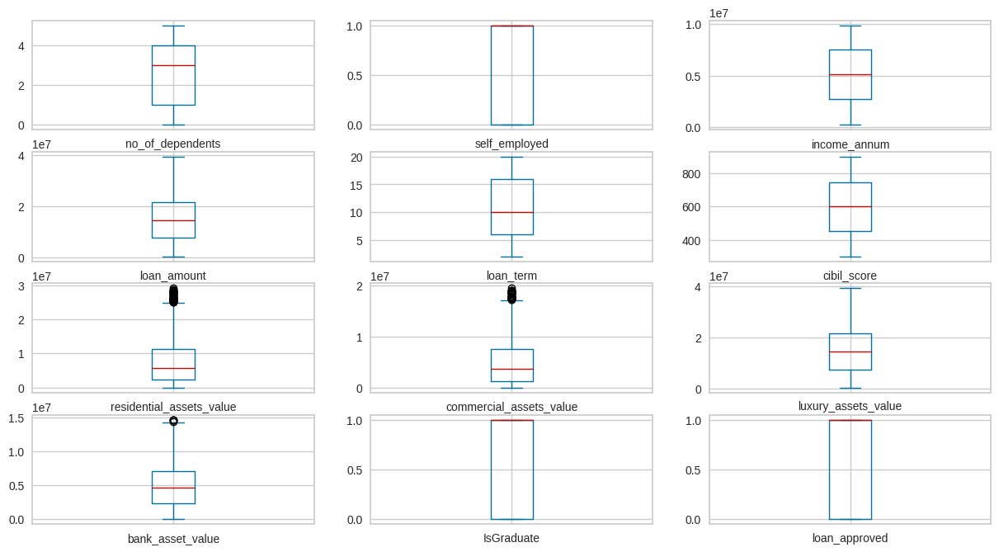

In [ ]:
# Visualize the cleaned data using box plots
loan_cleaned.plot(kind='box', subplots=True, sharex=False, sharey=False, layout=(5,3), figsize=(15,10))

**Outlier Removal Loop**: A loop is implemented to iteratively remove outliers for specified columns using the IQR method. A loop is used to run the method as long as needed.<br>
The loop has been executed 3 times, removing 161 records out of total 4269 records. (3.7% of the data)

In [ ]:
# Outlier removal loop for specified columns
count = -1
while True:
  count +=1
  prev_length = len(loan_cleaned)
  # Define the outlier removal process for 'commercial_assets_value'
  Q1 = loan_cleaned['commercial_assets_value'].quantile(0.25)
  Q3 = loan_cleaned['commercial_assets_value'].quantile(0.75)
  IQR = Q3 - Q1
  print(IQR)
  outliers = (loan_cleaned['commercial_assets_value'] > Q3 + 1.5 * IQR) | (loan_cleaned['commercial_assets_value'] < Q1 - 1.5 * IQR)
  loan_cleaned = loan_cleaned.loc[~outliers]
  # Similar process for 'residential_assets_value'
  Q1 = loan_cleaned['residential_assets_value'].quantile(0.25)
  Q3 = loan_cleaned['residential_assets_value'].quantile(0.75)
  IQR = Q3 - Q1

  outliers = (loan_cleaned['residential_assets_value'] > Q3 + 1.5 * IQR) |(loan_cleaned['residential_assets_value'] < Q1 - 1.5 * IQR)
  loan_cleaned = loan_cleaned.loc[~outliers]
  # Similar process for 'bank_asset_value'
  Q1 = loan_cleaned['bank_asset_value'].quantile(0.25)
  Q3 = loan_cleaned['bank_asset_value'].quantile(0.75)
  IQR = Q3 - Q1

  outliers = (loan_cleaned['bank_asset_value'] > Q3 + 1.5 * IQR)|(loan_cleaned['bank_asset_value'] < Q1 - 1.5 * IQR)
  loan_cleaned = loan_cleaned.loc[~outliers]
  new_length = len(loan_cleaned)
  # Break the loop if no outliers were removed in the last iteration (data length didn't change)
  if prev_length == new_length:
    break
# Print the number of iterations (count)
print(count)
# Display information about the cleaned dataset
loan_cleaned.info()

6300000.0
6100000.0
6000000.0
6000000.0
3
<class 'pandas.core.frame.DataFrame'>
Int64Index: 4108 entries, 1 to 4268
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   no_of_dependents          4108 non-null   int64
 1   self_employed             4108 non-null   int64
 2   income_annum              4108 non-null   int64
 3   loan_amount               4108 non-null   int64
 4   loan_term                 4108 non-null   int64
 5   cibil_score               4108 non-null   int64
 6   residential_assets_value  4108 non-null   int64
 7   commercial_assets_value   4108 non-null   int64
 8   luxury_assets_value       4108 non-null   int64
 9   bank_asset_value          4108 non-null   int64
 10  IsGraduate                4108 non-null   int64
 11  loan_approved             4108 non-null   int64
dtypes: int64(12)
memory usage: 417.2 KB


Box plots are used again after removing **outliers**. it is clear that the data no longer has outliers.

no_of_dependents               Axes(0.125,0.747241;0.227941x0.132759)
self_employed               Axes(0.398529,0.747241;0.227941x0.132759)
income_annum                Axes(0.672059,0.747241;0.227941x0.132759)
loan_amount                    Axes(0.125,0.587931;0.227941x0.132759)
loan_term                   Axes(0.398529,0.587931;0.227941x0.132759)
cibil_score                 Axes(0.672059,0.587931;0.227941x0.132759)
residential_assets_value       Axes(0.125,0.428621;0.227941x0.132759)
commercial_assets_value     Axes(0.398529,0.428621;0.227941x0.132759)
luxury_assets_value         Axes(0.672059,0.428621;0.227941x0.132759)
bank_asset_value                Axes(0.125,0.26931;0.227941x0.132759)
IsGraduate                   Axes(0.398529,0.26931;0.227941x0.132759)
loan_approved                Axes(0.672059,0.26931;0.227941x0.132759)
dtype: object

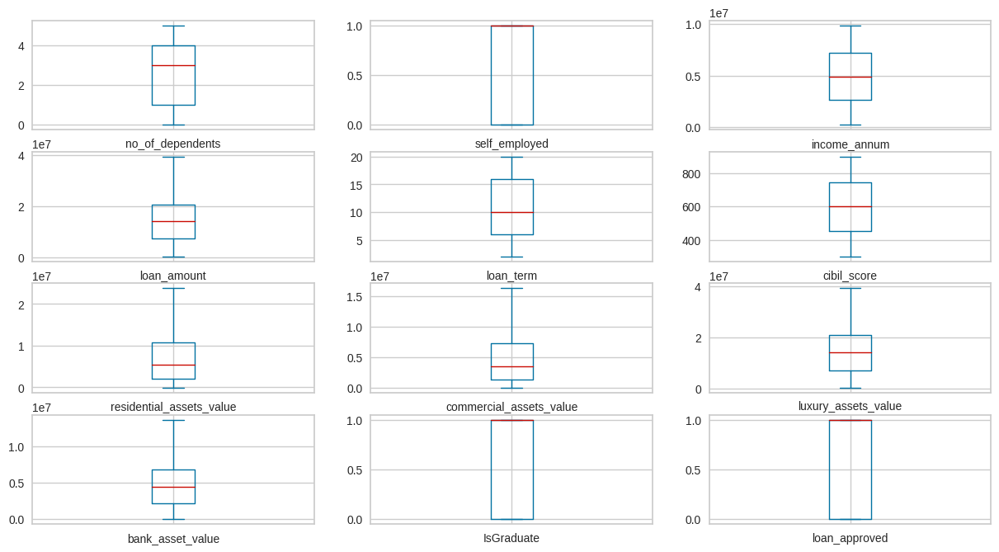

In [ ]:
# Visualize the cleaned data again using box plots
loan_cleaned.plot(kind='box', subplots=True, sharex=False, sharey=False, layout=(5,3), figsize=(15,10))

**Duplicate Rows**: Duplicate rows are checked and removed from the cleaned dataset if present. No duplicate rows were detected

In [ ]:
# Check for duplicate rows
duplicate_rows = loan_cleaned[loan_cleaned.duplicated()]
# Display information about duplicate rows if any
if not duplicate_rows.empty:
    print("Duplicate Rows:")
    print(duplicate_rows)
else:
    print("No Duplicate Rows")
# Remove duplicate rows if any
df_no_duplicates = loan_cleaned.drop_duplicates()

No Duplicate Rows


### Data Preprocessing Summary

The data preprocessing phase involved key steps to enhance dataset usability:

1. **Feature Engineering:**
   - Binary indicators (`IsGraduate`, `self_employed`, `loan_approved`) were created for categorical values.

2. **Outlier Handling:**
   - Iterative removal of outliers using the IQR method resulted in a 3.7% reduction (161 records).

3. **Duplicate Check:**
   - No duplicate rows were detected in the cleaned dataset
These preprocessing steps contribute to the refinement of the dataset, addressing potential challenges such as outliers and ensuring data integrity. The dataset is now well-prepared for subsequent phases of exploratory analysis and model development.

##Feature Extraction and Selection
In the following cells, we start the process of feature selection and analysis on the cleaned loan dataset. Feature selection is crucial for identifying the most relevant features while reducing dimensionality. We choose the features with high correlation with the response variable, and low correlation between each other.

###Testing Different Models Before Feature Selection

####Linear Regression

In [ ]:
# Separate target variable and features
loan_target=loan_cleaned['loan_amount']
loan_data=loan_cleaned.drop(['loan_amount'],axis=1)
# Set random seed for reproducibility
np.random.seed(42)
# Split the data into training and testing sets
X_train,X_test,Y_train,Y_test =train_test_split(loan_data,loan_target)
# Linear Regression
linear_reg=LinearRegression()
linear_reg.fit(X_train,Y_train)
predictions = linear_reg.predict(X_test)
print("Coefficients:", linear_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =linear_reg.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-8.65280405e+04  2.33629402e+04  3.00831592e+00  2.04029879e+04
 -2.25649693e+03  1.90567950e-02  2.97496041e-02 -5.00248965e-03
 -9.86461883e-03  8.85905086e+04  1.19376546e+06]
Mean Absolute Error (MAE): 2473631.968289818
Mean Squared Error (MSE): 10766501467205.434
Root Mean Squared Error (RMSE): 3281234.7473482345
R-Squared (R2): 0.857638258129729


####Ridge Regression

In [ ]:
# Ridge Regression
ridge=linear_model.Ridge()
ridge.fit(X_train,Y_train)
predictions = ridge.predict(X_test)
print("Coefficients:", ridge.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =ridge.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-8.65370772e+04  2.33329770e+04  3.00830334e+00  2.03598116e+04
 -2.24733133e+03  1.90577567e-02  2.97574834e-02 -5.00197909e-03
 -9.85822822e-03  8.84807925e+04  1.18953643e+06]
Mean Absolute Error (MAE): 2473604.765978903
Mean Squared Error (MSE): 10766533066966.934
Root Mean Squared Error (RMSE): 3281239.5625688373
R-Squared (R2): 0.8576378402969629


####Lasso Regression

In [ ]:
# Lasso Regression
lasso=linear_model.Lasso()
lasso.fit(X_train,Y_train)
predictions = ridge.predict(X_test)
print("Coefficients:", lasso.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =lasso.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-8.65277447e+04  2.33588237e+04  3.00831593e+00  2.04028568e+04
 -2.25647292e+03  1.90568049e-02  2.97495922e-02 -5.00248797e-03
 -9.86460578e-03  8.85863860e+04  1.19375444e+06]
Mean Absolute Error (MAE): 2473604.765978903
Mean Squared Error (MSE): 10766533066966.934
Root Mean Squared Error (RMSE): 3281239.5625688373
R-Squared (R2): 0.8576382797465067


####ElasticNet Regression

In [ ]:
# ElasticNet Regression
elastic=linear_model.ElasticNet()
elastic.fit(X_train,Y_train)
predictions = elastic.predict(X_test)
print("Coefficients:", elastic.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =elastic.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [-7.75113861e+04  7.53178565e+03  3.00558503e+00  1.00497896e+04
 -6.86657246e+01  1.92770999e-02  3.15758527e-02 -4.84878873e-03
 -8.49584913e-03  2.97980947e+04  1.84520728e+05]
Mean Absolute Error (MAE): 2482255.774455877
Mean Squared Error (MSE): 10855151913102.555
Root Mean Squared Error (RMSE): 3294715.7560406565
R-Squared (R2): 0.856466063807002


####Polynomial Regression

In [ ]:
# Polynomial Regression (Degree = 2)
degree = 2
# Generating polynomial features

poly_features = PolynomialFeatures(degree=degree, include_bias=False)
# fits the PolynomialFeatures instance to the training data and transforms it
X_train_poly = poly_features.fit_transform(X_train)
#  transforms the test data using the same polynomial features that were generated from the training data.
X_test_poly = poly_features.transform(X_test)
# Linear Regression with Polynomial Features
reg=LinearRegression()
reg.fit(X_train_poly,Y_train)
predictions = reg.predict(X_test_poly)
print("Coefficients:", reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =reg.score(X_test_poly,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [ 2.52795361e+05  7.05739729e+04  3.54731782e+00  1.27077814e+05
  5.13046603e+03 -2.07262259e-01  7.36735219e-02 -2.02086686e-02
 -4.96933651e-03  4.88450257e+04  4.25490732e+04 -2.52779999e+03
  1.49078129e+05 -1.37994366e-01  7.14760769e+03 -8.34865209e+02
  2.30445746e-03  2.89629883e-02  2.35482833e-02  1.15217234e-02
  1.14311622e+05  1.40501607e+05  2.14023013e+05 -6.55393901e-02
 -3.65313795e+04 -3.77415029e+02  1.01728029e-01 -3.76666781e-01
  1.13253194e-01 -9.02818526e-02 -5.36296395e+04  1.23920582e+05
 -2.94410587e-08 -1.31304062e-02  9.91413777e-04  2.73721525e-08
  4.85451892e-08  2.07364792e-08 -1.17783202e-07  3.34939331e-01
 -8.41561850e-01 -8.66989724e+03  3.97307543e+02  9.43255645e-03
  6.20361920e-03 -4.67403361e-03  8.49285008e-03  2.90716980e+04
 -2.71555437e+05 -4.45074397e+00 -4.09874017e-04 -6.42520972e-04
 -2.74037862e-04  4.23760444e-04 -2.58831666e+03  2.28845305e+03
  3.17959348e-09  7.15772330e-09 -8.52742232e-09  7.68341124e-09
 -4.0884470

###Feature Selection Using Ordinary Methods (Not PCA)

**Point-Biserial Correlation**: Point-Biserial correlation measures the correlation between a binary variable and a continuous variable. In this context, it helps us understand the relationship between binary features ('IsGraduate', 'self_employed', 'loan_approved') and the target variable ('loan_amount').

In [ ]:
loan_features_selected=loan_cleaned
# Display point-biserial correlation between 'IsGraduate' and 'loan_amount'
correlation, _ = pointbiserialr(loan_features_selected['loan_amount'], loan_features_selected['IsGraduate'])
print(f"Point-Biserial Correlation between IsGraduate and loan_amount: {correlation:.2f}")
# Display point-biserial correlation between 'self_employed' and 'loan_amount'
correlation, _ = pointbiserialr(loan_features_selected['loan_amount'], loan_features_selected['self_employed'])
print(f"Point-Biserial Correlation between self_employed and loan_amount: {correlation:.2f}")
# Display point-biserial correlation between 'loan_approved' and 'loan_amount'
correlation, _ = pointbiserialr(loan_features_selected['loan_amount'], loan_features_selected['loan_approved'])
print(f"Point-Biserial Correlation between loan_approaved and loan_amount: {correlation:.2f}")

Point-Biserial Correlation between IsGraduate and loan_amount: 0.02
Point-Biserial Correlation between self_employed and loan_amount: 0.00
Point-Biserial Correlation between loan_approaved and loan_amount: 0.02


The calculated values are very small indicating **no correlation** with the response variable.

**Scatter Plots with Density-Based Coloring**: Scatter plots with density-based coloring provide a visual representation of the relationship between binary features and the target variable. The coloring helps highlight areas of higher data density, making it easier to identify patterns or trends in the data.

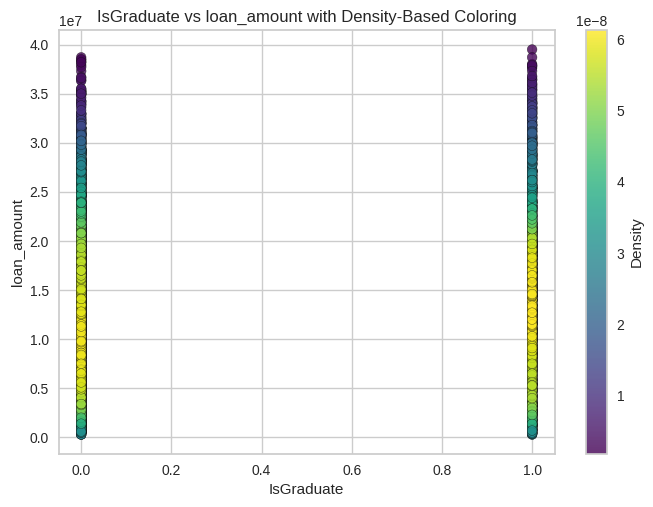

In [ ]:
# Scatter plot with density-based coloring for 'IsGraduate' vs 'loan_amount'

column1 = 'IsGraduate'
column2 = 'loan_amount'

# Calculate density
x = loan_features_selected[column1]
y = loan_features_selected[column2]
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Create a scatter plot with density-based coloring
fig, ax = plt.subplots()
sc = ax.scatter(x, y, c=density, cmap='viridis', edgecolors='k', alpha=0.8)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, label='Density')

# Set labels and title
ax.set_title(f'{column1} vs {column2} with Density-Based Coloring')
ax.set_xlabel(column1)
ax.set_ylabel(column2)

plt.show()

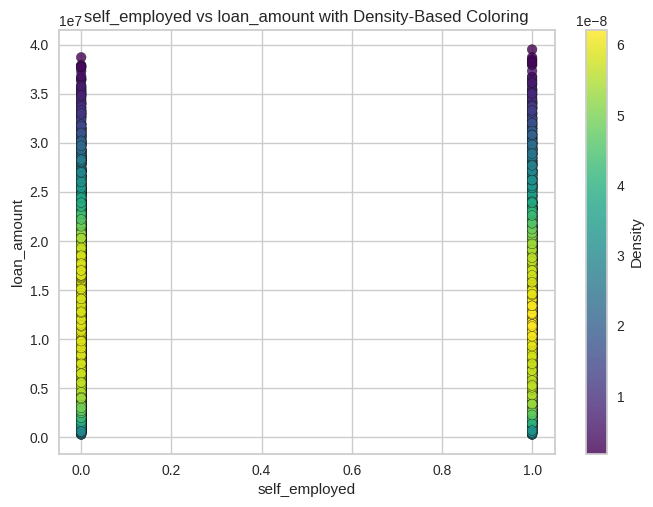

In [ ]:
# Scatter plot with density-based coloring for 'self_employed' vs 'loan_amount'
column1 = 'self_employed'
column2 = 'loan_amount'

# Calculate density
x = loan_features_selected[column1]
y = loan_features_selected[column2]
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Create a scatter plot with density-based coloring
fig, ax = plt.subplots()
sc = ax.scatter(x, y, c=density, cmap='viridis', edgecolors='k', alpha=0.8)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, label='Density')

# Set labels and title
ax.set_title(f'{column1} vs {column2} with Density-Based Coloring')
ax.set_xlabel(column1)
ax.set_ylabel(column2)

plt.show()

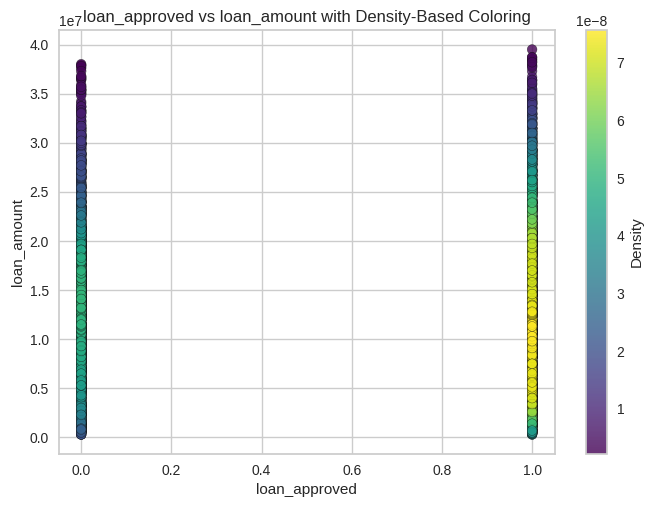

In [ ]:
# Scatter plot with density-based coloring for 'loan_approved' vs 'loan_amount'
column1 = 'loan_approved'
column2 = 'loan_amount'

# Calculate density
x = loan_features_selected[column1]
y = loan_features_selected[column2]
xy = np.vstack([x, y])
density = gaussian_kde(xy)(xy)

# Create a scatter plot with density-based coloring
fig, ax = plt.subplots()
sc = ax.scatter(x, y, c=density, cmap='viridis', edgecolors='k', alpha=0.8)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, label='Density')

# Set labels and title
ax.set_title(f'{column1} vs {column2} with Density-Based Coloring')
ax.set_xlabel(column1)
ax.set_ylabel(column2)

plt.show()

Analyzing the **scatter plots**, it is evident that there are **no correlation** between any of the binary variables and the response variable. This further supports the findings of the very low values of Point-Biserial correlation coefficient. You can notice that the distribution of loan_amount data is very similar for both 0 and 1 values in the three graphs. As a result, the three categorical features are dropped.

In [ ]:
# Drop the three categorical features
loan=loan_features_selected.drop(['IsGraduate','self_employed','loan_approved'],axis=1)

**Correlation Matrix Heatmap**: A heatmap of the correlation matrix is displayed to visualize the correlation between different features.

                          no_of_dependents  self_employed  income_annum  \
no_of_dependents                  1.000000       0.003144      0.012749   
self_employed                     0.003144       1.000000      0.004094   
income_annum                      0.012749       0.004094      1.000000   
loan_amount                      -0.000408       0.000916      0.928698   
loan_term                        -0.022518       0.010207      0.006739   
cibil_score                      -0.011777      -0.004598     -0.018090   
residential_assets_value          0.017555       0.012041      0.623611   
commercial_assets_value           0.002103      -0.024924      0.628193   
luxury_assets_value               0.009385       0.007110      0.930146   
bank_asset_value                  0.014837      -0.000139      0.851794   
IsGraduate                        0.004004      -0.018570      0.019648   
loan_approved                    -0.017362       0.002516     -0.007095   

                        

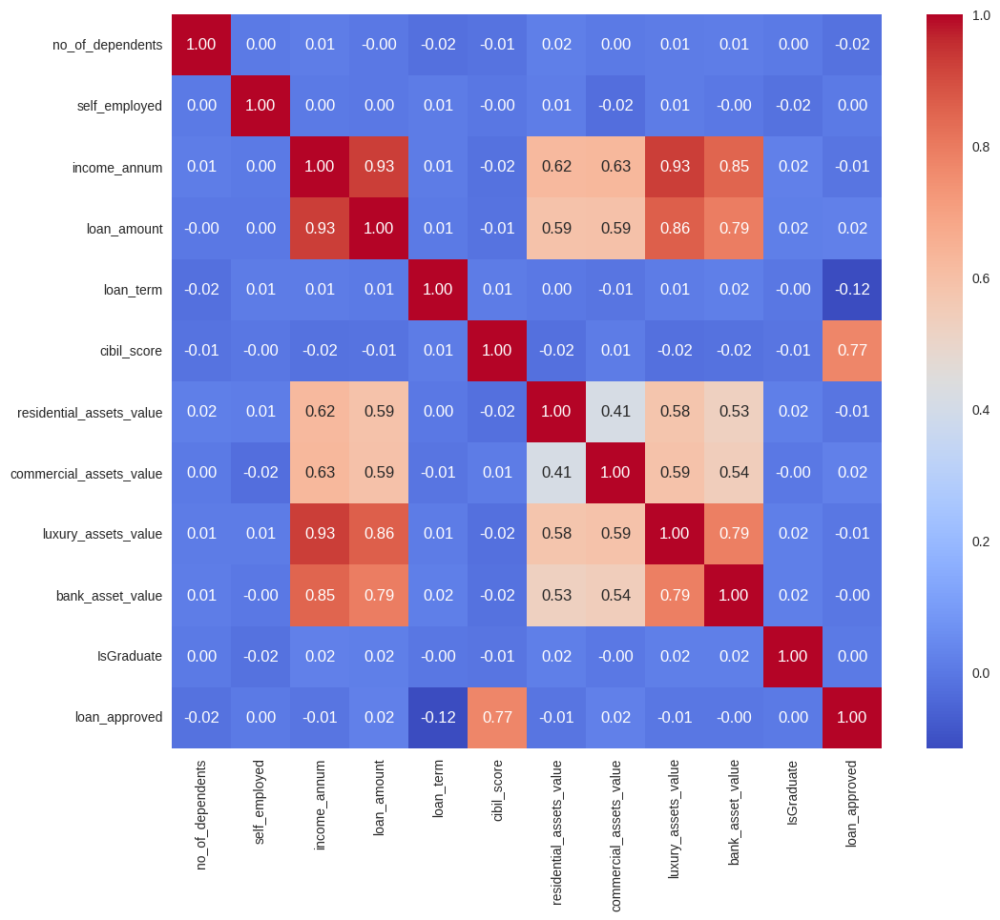

In [ ]:
# Display correlation matrix heatmap
corr_matrix = loan_features_selected.corr()
print(corr_matrix)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f").figure.set_size_inches(12, 10)
plt.show()

**Feature Selection based on Correlation**: Features are selected based on their correlation with the target variable ('loan_amount'). The correlation coefficients are sorted in descending order, and features with correlations higher than a specified threshold (in this case, 0.5) are chosen. These selected features are likely to have a stronger relationship with the target variable. The features that satisfies the constraint are: ['income_annum', 'luxury_assets_value', 'bank_asset_value', 'commercial_assets_value', 'residential_assets_value']

In [ ]:
#Identify predictor-response relationships
target_corr = corr_matrix['loan_amount'].abs().sort_values(ascending=False)
print("Correlation with the target variable:\n", target_corr)
target_corr = target_corr[1:]
# Set correlation threshold for feature selection
correlation_target_threshold = 0.5
# Select the featues for which its correlation coefficient with the response exceeds the threshold
selected_features = target_corr[target_corr > correlation_target_threshold].index.tolist()
print(selected_features)

Correlation with the target variable:
 loan_amount                 1.000000
income_annum                0.928698
luxury_assets_value         0.864609
bank_asset_value            0.792468
commercial_assets_value     0.590488
residential_assets_value    0.590313
loan_approved               0.023261
IsGraduate                  0.017381
cibil_score                 0.012454
loan_term                   0.005525
self_employed               0.000916
no_of_dependents            0.000408
Name: loan_amount, dtype: float64
['income_annum', 'luxury_assets_value', 'bank_asset_value', 'commercial_assets_value', 'residential_assets_value']


**High Correlation Removal**: Columns with high correlation between them can lead to multicollinearity issues, where the presence of one feature can predict the presence of another. To address this, pairs of highly correlated columns are identified, and one of the columns is removed from the list of selected features. This step ensures that the selected features are diverse and not redundant. This step identifies ['luxury_assets_value', 'luxury_assets_value', 'bank_asset_value'] as redundant, and thus removes them.

In [ ]:
# Find columns with high correlation with each other and remove them from selected features
high_corr_columns = []
correlation_threshold = 0.8
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > correlation_threshold:
            colname = corr_matrix.columns[i]
            high_corr_columns.append(colname)
print(high_corr_columns)
# remove the high correlated features from the set of chosen features
for column in high_corr_columns:
  if column in selected_features:
    selected_features.remove(column)
# print the final set of chosen features
print(selected_features)

['loan_amount', 'luxury_assets_value', 'luxury_assets_value', 'bank_asset_value']
['income_annum', 'commercial_assets_value', 'residential_assets_value']


In [ ]:
# Use VarianceThreshold for additional feature selection based on variance
selector = VarianceThreshold()
selector.fit_transform(loan_features_selected[selected_features])
print(selector.variances_)

[ 9700000. 16300000. 23900000.]


The chosen features have high variance.

In [ ]:
# Update the dataset with selected features
loan_target=loan_features_selected['loan_amount']
loan_features_selected=loan_features_selected[selected_features]

### Feature Selection Summary

In summary, the feature selection phase involved:

1. **Point-Biserial Correlation:**
   - Minimal correlation was observed between binary features ('IsGraduate', 'self_employed', 'loan_approved') and the target variable ('loan_amount').

2. **Feature Selection based on Correlation:**
   - Features with correlations above 0.5 with the target variable were chosen: ['income_annum', 'luxury_assets_value', 'bank_asset_value', 'commercial_assets_value', 'residential_assets_value'].

3. **High Correlation Removal:**
   - Addressing multicollinearity by removing redundant features resulted in the selection of diverse and relevant features: ['income_annum', 'commercial_assets_value', 'residential_assets_value'].

These steps streamline the feature set, ensuring that selected features are relevant, diverse, and free from redundancy. The refined feature set is now poised for integration into the machine learning model.

###Testing Different Models After Feature Selection

####Linear Regression

In [ ]:
loan_data=loan_features_selected
# Set random seed for reproducibility
np.random.seed(42)
# Split the data into training and testing sets
X_train,X_test,Y_train,Y_test =train_test_split(loan_data,loan_target)
# Linear Regression
linear_reg=LinearRegression()
linear_reg.fit(X_train,Y_train)
predictions = linear_reg.predict(X_test)
print("Coefficients:", linear_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =linear_reg.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [2.98273228 0.03227985 0.01908875]
Mean Absolute Error (MAE): 2474337.6941674147
Mean Squared Error (MSE): 10832802030368.643
Root Mean Squared Error (RMSE): 3291322.2313180827
R-Squared (R2): 0.8567615886110702


####Ridge Regression

In [ ]:
# Ridge Regression
ridge=linear_model.Ridge()
ridge.fit(X_train,Y_train)
predictions = ridge.predict(X_test)
print("Coefficients:", ridge.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =ridge.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [2.98273228 0.03227985 0.01908875]
Mean Absolute Error (MAE): 2474337.6941674147
Mean Squared Error (MSE): 10832802030368.645
Root Mean Squared Error (RMSE): 3291322.231318083
R-Squared (R2): 0.8567615886110702


####Lasso Regression

In [ ]:
# Lasso Regression
lasso=linear_model.Lasso()
lasso.fit(X_train,Y_train)
predictions = lasso.predict(X_test)
print("Coefficients:", lasso.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =lasso.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [2.98273228 0.03227985 0.01908875]
Mean Absolute Error (MAE): 2474337.6941673867
Mean Squared Error (MSE): 10832802030368.35
Root Mean Squared Error (RMSE): 3291322.231318038
R-Squared (R2): 0.8567615886110741


####ElasticNet Regression

In [ ]:
# ElasticNet Regression
elastic=linear_model.ElasticNet()
elastic.fit(X_train,Y_train)
predictions = elastic.predict(X_test)
print("Coefficients:", elastic.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =elastic.score(X_test,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [2.98273228 0.03227985 0.01908875]
Mean Absolute Error (MAE): 2474337.6941673565
Mean Squared Error (MSE): 10832802030368.07
Root Mean Squared Error (RMSE): 3291322.2313179956
R-Squared (R2): 0.8567615886110778


####Polynomial Regression

In [ ]:
# Polynomial Regression (Degree = 2)
degree = 2
# Generating polynomial features

poly_features = PolynomialFeatures(degree=degree, include_bias=False)
# fits the PolynomialFeatures instance to the training data and transforms it
X_train_poly = poly_features.fit_transform(X_train)
#  transforms the test data using the same polynomial features that were generated from the training data.
X_test_poly = poly_features.transform(X_test)
# Linear Regression with Polynomial Features
reg=LinearRegression()
reg.fit(X_train_poly,Y_train)
predictions = reg.predict(X_test_poly)
print("Coefficients:", reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =reg.score(X_test_poly,Y_test)
print("R-Squared (R2):", r2)

Coefficients: [ 3.09413806e+00 -1.06154949e-01 -6.56871778e-02 -1.34139869e-08
  2.81774635e-08 -3.88256429e-09 -9.07538304e-09  6.20998292e-09
  3.39803835e-09]
Mean Absolute Error (MAE): 2477773.4342108564
Mean Squared Error (MSE): 10877566759447.26
Root Mean Squared Error (RMSE): 3298115.6376705864
R-Squared (R2): 0.856169680011476


## Feature Selection and Extraction Impact

The feature selection and extraction step demonstrated a nuanced impact on model performance. While simpler models like linear regression showed minimal changes, more complex models like polynomial regression benefited from the refined feature set

##Data Standardization
In this section, we standardize the data. We iterate over different training and testing split ratios to find the optimal configuration for each model corresponding to the heighest R-squared scores. Then the dataset is split into training and testing sets with the best ratio, and the features are standardized.


In [ ]:
# Define the split ratios for training and testing
split_ratios = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]

# Define the models to be evaluated
models = {
    'Linear Regression': LinearRegression(),
    'Ridge': linear_model.Ridge(),
    'Lasso': linear_model.Lasso(),
    'Elastic Net': linear_model.ElasticNet(),
    'Polynomial Regression (Degree 2)': make_pipeline(PolynomialFeatures(2), LinearRegression())
}

# Initialize a dictionary to store the best results for each model
best_results = {model_name: {'split_ratio': None, 'r2_score': float('-inf')} for model_name in models}

# Loop over split ratios and models
for ratio in split_ratios:
    for model_name, model in models.items():
        # Split the data
        X_train, X_test, Y_train, Y_test = train_test_split(loan_features_selected, loan_target, test_size=1-ratio, random_state=42)

        # Train the model
        model.fit(X_train, Y_train)

        # Evaluate the R-squared score on the test set
        r2 = model.score(X_test,Y_test)

        # Print the R-squared for the current split ratio and model
        print(f'{model_name} - Split Ratio: {ratio:.2f}, R-squared Score: {r2:.4f}')

        # Update the best split ratio if the current ratio has a higher R-squared score
        if r2 > best_results[model_name]['r2_score']:
            best_results[model_name]['r2_score'] = r2
            best_results[model_name]['split_ratio'] = ratio

# Print the best split ratios and R-squared scores for each model
for model_name, result in best_results.items():
    print(f'\nBest Split Ratio for {model_name}: {result["split_ratio"]:.2f}, Best R-squared Score: {result["r2_score"]:.4f}')

Linear Regression - Split Ratio: 0.60, R-squared Score: 0.8591
Ridge - Split Ratio: 0.60, R-squared Score: 0.8591
Lasso - Split Ratio: 0.60, R-squared Score: 0.8591
Elastic Net - Split Ratio: 0.60, R-squared Score: 0.8591
Polynomial Regression (Degree 2) - Split Ratio: 0.60, R-squared Score: 0.8575
Linear Regression - Split Ratio: 0.65, R-squared Score: 0.8568
Ridge - Split Ratio: 0.65, R-squared Score: 0.8568
Lasso - Split Ratio: 0.65, R-squared Score: 0.8568
Elastic Net - Split Ratio: 0.65, R-squared Score: 0.8568
Polynomial Regression (Degree 2) - Split Ratio: 0.65, R-squared Score: 0.8549
Linear Regression - Split Ratio: 0.70, R-squared Score: 0.8601
Ridge - Split Ratio: 0.70, R-squared Score: 0.8601
Lasso - Split Ratio: 0.70, R-squared Score: 0.8601
Elastic Net - Split Ratio: 0.70, R-squared Score: 0.8601
Polynomial Regression (Degree 2) - Split Ratio: 0.70, R-squared Score: 0.8591
Linear Regression - Split Ratio: 0.75, R-squared Score: 0.8568
Ridge - Split Ratio: 0.75, R-squared 

The best **split ratio** across all models is (0.7) . The data is then **standardized** using fit of only training data to prevent **data leakage**.

In [ ]:
# Split the data into training and testing sets with a specific ratio
X_train, X_test, Y_train, Y_test = train_test_split(loan_features_selected, loan_target, test_size=0.3, train_size=0.7, random_state=42)
# Standardize the features using StandardScaler
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

## Cross Validation and Testing
In this section, hyperparameter tuning is conducted for all regression models. For each model, the search for optimal hyperparameters involved varying the number of folds (K) for cross-validation for all models, the regularization parameter (alpha) in Ridge, Lasso,and Elastic Net (also l1) Regression, and the (degree) paramerter for polynomial regression.



Scatter plots were generated to visually compare the true vs predicted values for the three selected features in all models.

In [ ]:
# Define alpha values for regularization
alpha_values = [0.001, 0.01, 0.1, 0.5 ,1, 10, 100,500,1000,1500,2000,5000,10000]
l1_ratios = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

###Linear Regression Testing and Visualization

In [ ]:
# Initialize variables for Linear Regression hyperparameter (k) tuning
best_k = None
best_score = float('-inf')

# Hyperparameter tuning for the number of folds (K) in cross-validation
for k in range(2, 11):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    model = LinearRegression()
    scores = cross_val_score(model, X_train, Y_train, cv=kf, scoring='neg_mean_squared_error')
    mean_score = np.mean(scores)

    if mean_score > best_score:
        best_score = mean_score
        best_k = k

print(f"Best number of folds (K): {best_k}")

Best number of folds (K): 4


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
linear_reg= LinearRegression()

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2499051.9874428334
Mean Squared Error (MSE) scores: 10711941467969.004
R-squared (R2) scores: 0.8630641245420505


Coefficients: [8111757.25602555   80472.72392265   96312.4717758 ]
Mean Absolute Error (MAE): 2475431.1244294206
Mean Squared Error (MSE): 10761014764480.738
Root Mean Squared Error (RMSE): 3280398.56793054
R-Squared (R2): 0.8600905655070776


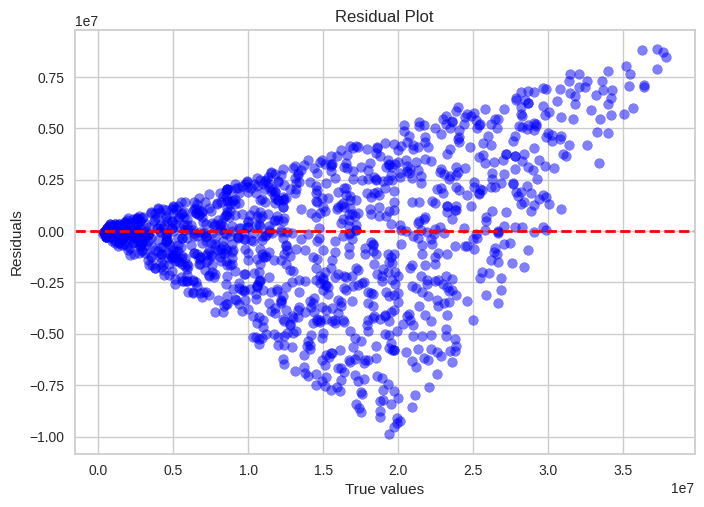

In [ ]:
# Fit the Linear Regression model on the training data
linear_reg.fit(X_train,Y_train)
predictions = linear_reg.predict(X_test)
print("Coefficients:", linear_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =linear_reg.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

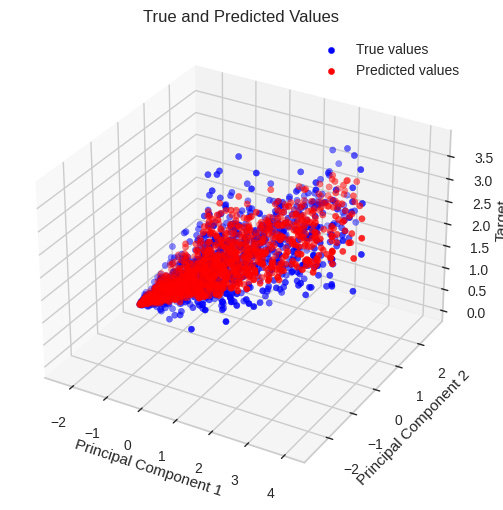

In [ ]:
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

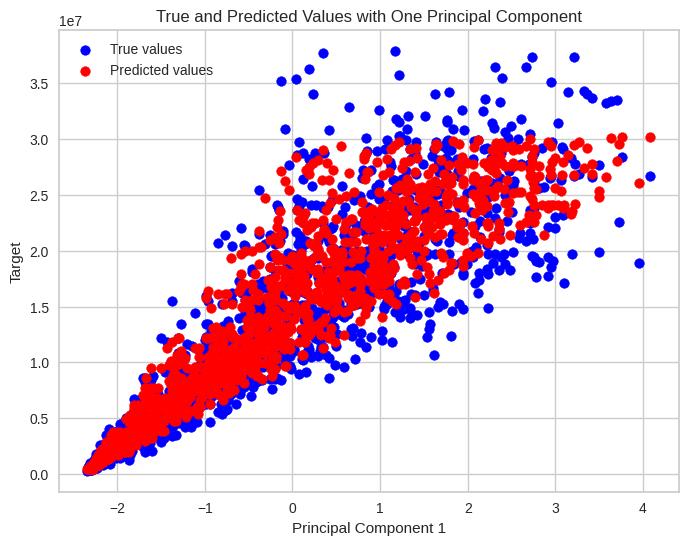

In [ ]:
# Apply PCA to X_test for visualization with one principal component
pca = PCA(n_components=1)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Ridge Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and alpha) for Ridge Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
        model = linear_model.Ridge(alpha)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_params = {'num_folds': num_folds,'alpha': alpha}


# Display the best hyperparameters
print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 4, 'alpha': 1}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
ridge= ridge=linear_model.Ridge(best_alpha)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2498952.3570885155
Mean Squared Error (MSE) scores: 10711861098094.389
R-squared (R2) scores: 0.8630652795242186


Coefficients: [8105629.64275581   83123.15961351   98988.26586219]
Mean Absolute Error (MAE): 2475236.2469099252
Mean Squared Error (MSE): 10758581334072.31
Root Mean Squared Error (RMSE): 3280027.642272594
R-Squared (R2): 0.8601222037753796


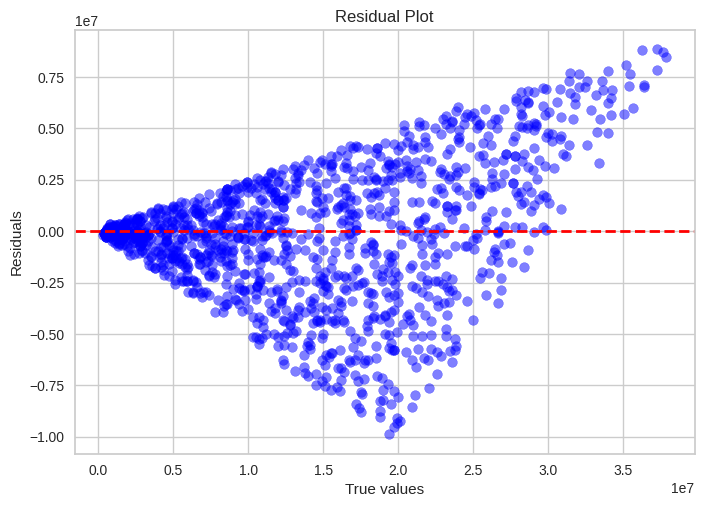

In [ ]:
# Fit the Ridge Regression model on the training data
ridge.fit(X_train,Y_train)
predictions = ridge.predict(X_test)

print("Coefficients:", ridge.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =ridge.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

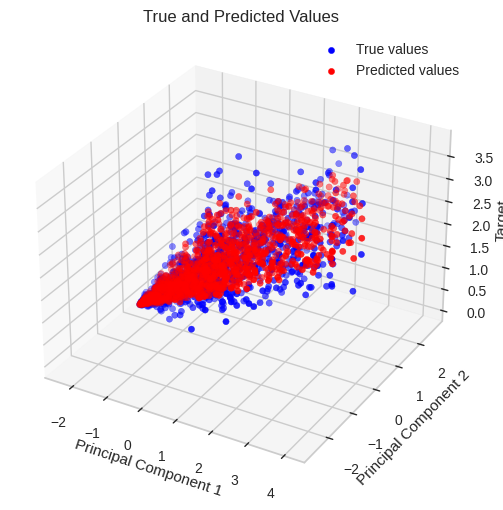

In [ ]:
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

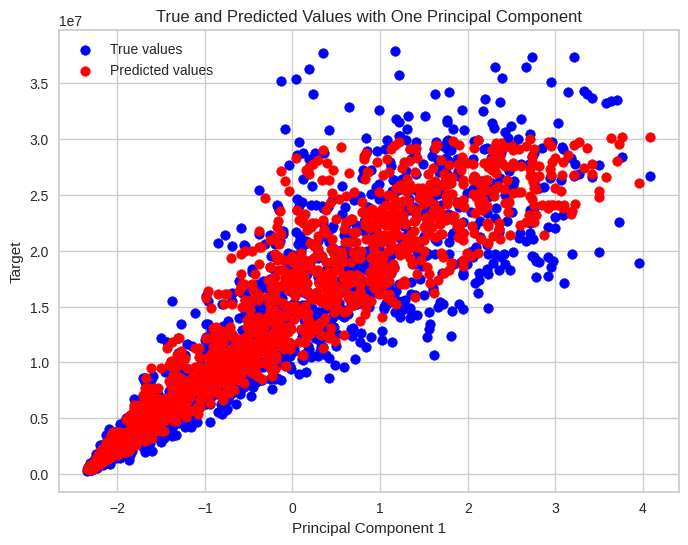

In [ ]:
pca = PCA(n_components=1)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test_pca[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Lasso Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and alpha) for Lasso Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
        model = linear_model.Lasso(alpha)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_params = {'num_folds': num_folds,'alpha': alpha}


print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 4, 'alpha': 500}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
lasso=linear_model.Lasso(best_alpha)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='r2'))

# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2499032.8632968306
Mean Squared Error (MSE) scores: 10711945379305.17
R-squared (R2) scores: 0.8630640633904688


Coefficients: [8111827.9840071    80214.56005226   95876.14353005]
Mean Absolute Error (MAE): 2475432.4866330726
Mean Squared Error (MSE): 10760947999073.967
Root Mean Squared Error (RMSE): 3280388.3914978676
R-Squared (R2): 0.8600914335581406


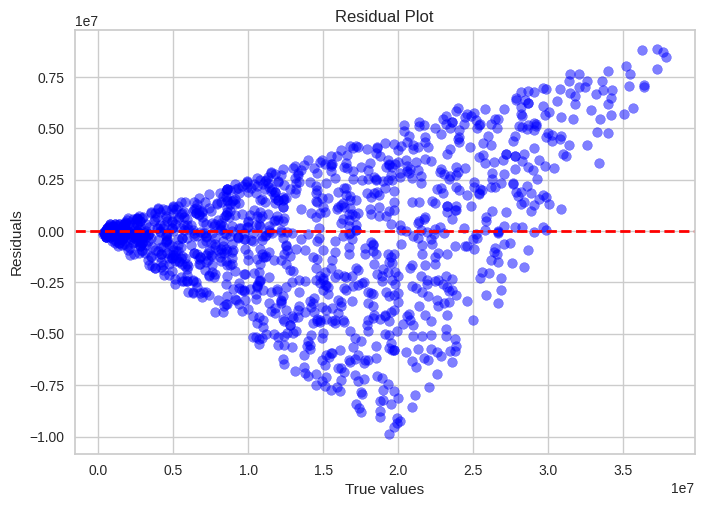

In [ ]:
# Fit the Lasso Regression model on the training data
lasso.fit(X_train,Y_train)
predictions = lasso.predict(X_test)

print("Coefficients:", lasso.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =lasso.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

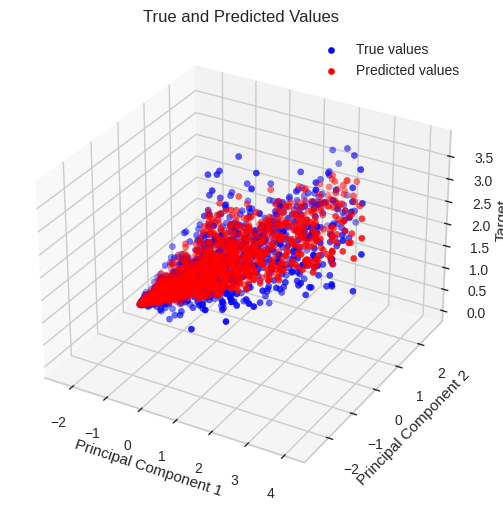

In [ ]:
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

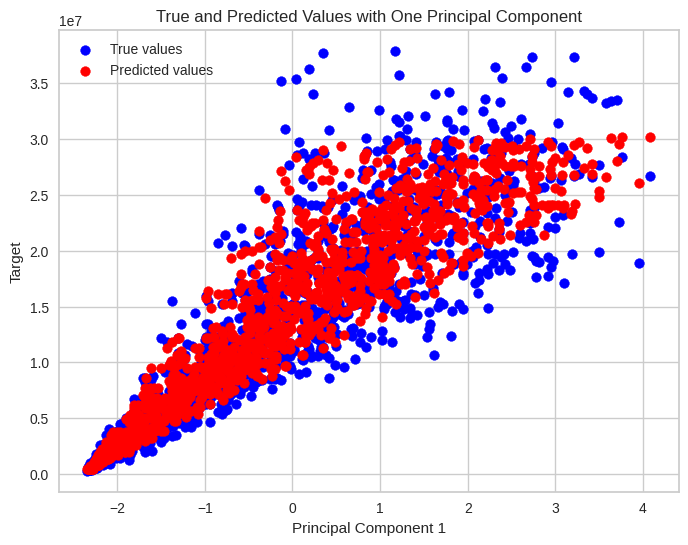

In [ ]:
pca = PCA(n_components=1)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test_pca[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

###Elastic Net Testing and Visualization

In [ ]:
# Hyperparameter tuning (k, alpha, l1) for Elastic Net Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_l1=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
      for l1_ratio in l1_ratios:
        model = linear_model.ElasticNet(alpha=alpha,l1_ratio=l1_ratio)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_l1=l1_ratio
                best_params = {'num_folds': num_folds, 'alpha': alpha,'l1_ratio': l1_ratio}


print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 4, 'alpha': 0.001, 'l1_ratio': 0.6}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
elastic=linear_model.ElasticNet(alpha=best_alpha,l1_ratio=best_l1)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='r2'))

# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2498966.009414469
Mean Squared Error (MSE) scores: 10711868676349.098
R-squared (R2) scores: 0.8630651651800099


Coefficients: [8104711.61359911   83520.12870902   99389.0298144 ]
Mean Absolute Error (MAE): 2475207.5510484343
Mean Squared Error (MSE): 10758219589645.398
Root Mean Squared Error (RMSE): 3279972.4983062586
R-Squared (R2): 0.8601269069989425


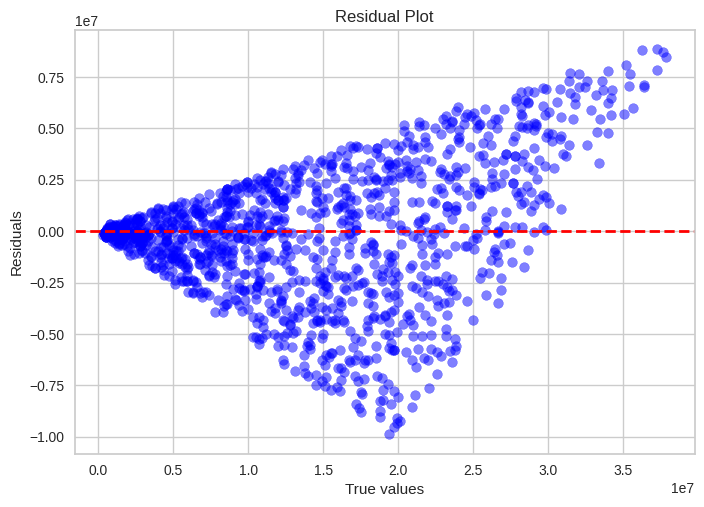

In [ ]:
# Fit the elstic net Regression model on the training data
elastic.fit(X_train,Y_train)
predictions = elastic.predict(X_test)

print("Coefficients:", elastic.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =elastic.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

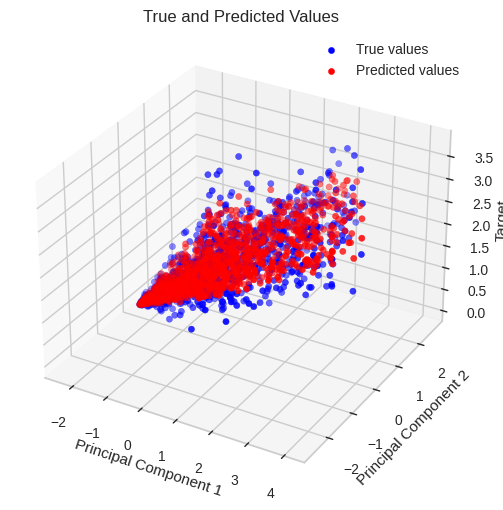

In [ ]:
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

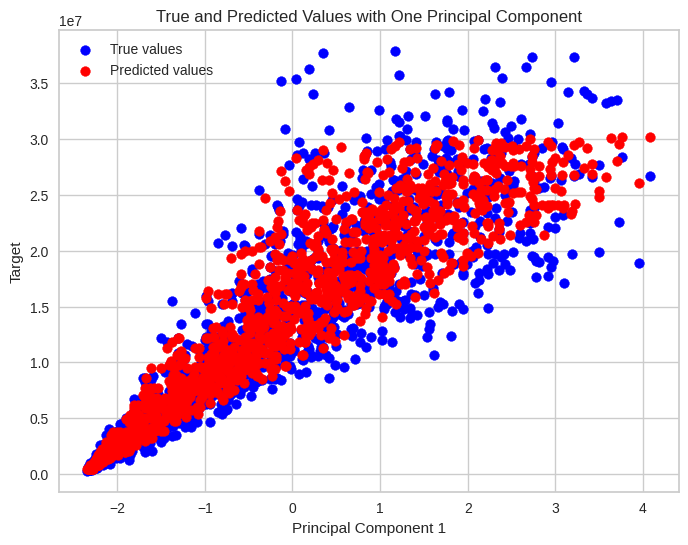

In [ ]:
pca = PCA(n_components=1)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test_pca[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Polynomial Regression Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and degree) for Polynomial Regression
best_k = None
best_degree=None
best_params = {}
best_score = float('-inf')

for k in range(2, 11):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    for degree in range(2, 11):
      poly_features = PolynomialFeatures(degree=degree, include_bias=False)
      X_train_poly = poly_features.fit_transform(X_train)
      X_test_poly = poly_features.transform(X_test)
      model = LinearRegression()
      scores = cross_val_score(model, X_train_poly, Y_train, cv=kf, scoring='neg_mean_squared_error')
      mean_score = np.mean(scores)
      if mean_score > best_score:
        best_score = mean_score
        best_k = k
        best_degree=degree
        best_params = {'num_folds': num_folds, 'degree':degree}


print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 10, 'degree': 2}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
# Create the polynomial features
poly_features = PolynomialFeatures(degree=best_degree, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

polynomial_reg= LinearRegression()
# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2493400.6234652908
Mean Squared Error (MSE) scores: 10688253987070.182
R-squared (R2) scores: 0.862744807169977


[8343532.51273726  -71636.29358325  -70110.37995364  -81731.32904375
  326503.58646948 -113897.70574553 -194265.62210837  191914.59396479
  149916.92180268]
Coefficients: [8343532.51273726  -71636.29358325  -70110.37995364  -81731.32904375
  326503.58646948 -113897.70574553 -194265.62210837  191914.59396479
  149916.92180268]
Mean Absolute Error (MAE): 2482759.3633559966
Mean Squared Error (MSE): 10836940169773.967
Root Mean Squared Error (RMSE): 3291950.8152118507
R-Squared (R2): 0.8591034206373127


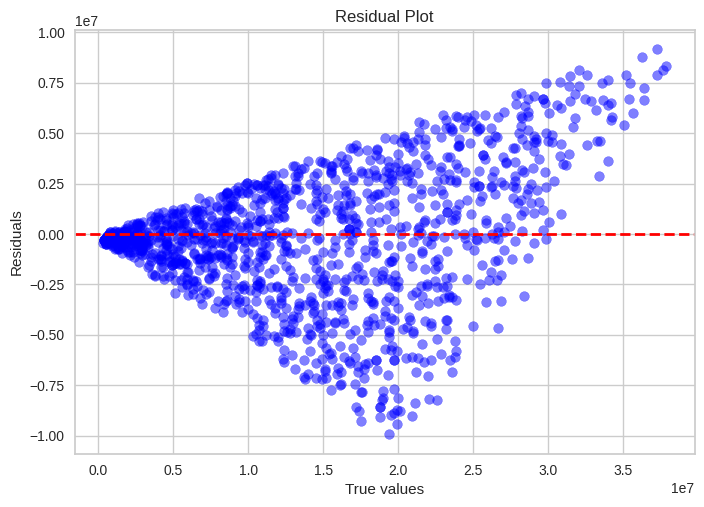

In [ ]:
# Fit the Polynomial Regression model on the training data
polynomial_reg.fit(X_train_poly,Y_train)
predictions = polynomial_reg.predict(X_test_poly)
print(polynomial_reg.coef_)
print("Coefficients:", polynomial_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =polynomial_reg.score(X_test_poly,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

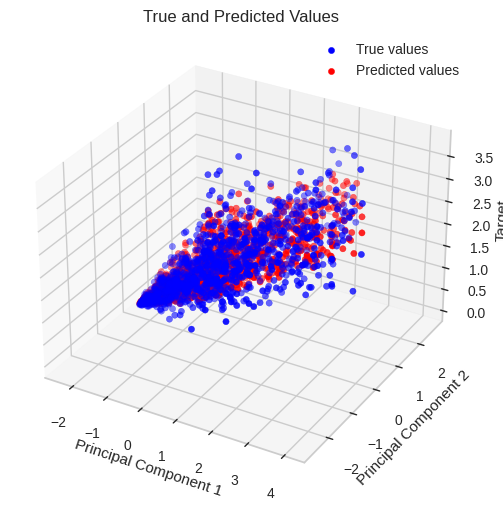

In [ ]:
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], X_test_pca[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

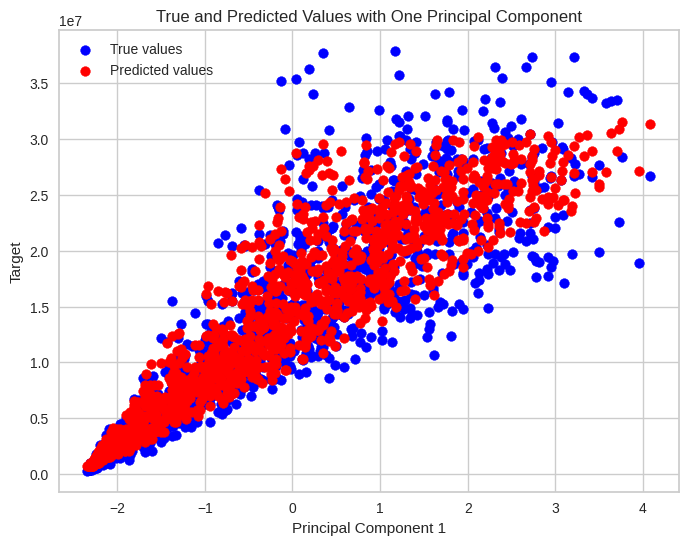

In [ ]:
pca = PCA(n_components=1)
X_test_pca = pca.fit_transform(X_test)

# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test_pca[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test_pca[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Conclusions:

1. **Consistent Performance:**
   - Linear, Ridge, Lasso, and Elastic-Net regressions demonstrate similar and consistent performance, as reflected in their close $R^2$ scores and error metrics.

2. **Polyynomial Regression:**
   - Polynomial regression, while slightly behind in $R^2$, maintains competitive performance with similar error metrics.

  Overall, the models show strong predictive capabilities, and the choice between them may depend on specific considerations such as interpretability and computational complexity.

## Regression With PCA


In this section, we apply Principal Component Analysis (PCA) to reduce the dimensionality of the feature space. Unlike the correlation analysis methods used in the previous section, PCA offers an alternative approach for feature extraction. We aim to compare the effects of these two distinct methods on the performance of various models.

The process involves:
1. Visualizing the cumulative explained variance ratio to determine the optimal number of components to retain.
2. Performing PCA on both the training and testing data, creating new features represented by principal components ('PC1' to 'PC5').

This comparative analysis allows us to assess the impact of different feature extraction methods on the performance of our models.

In [ ]:
# Separate target variable and features
loan_target=loan_cleaned['loan_amount']
loan_data=loan_cleaned.drop('loan_amount',axis=1)
# Split the dataset into training and testing sets using the same split used before
X_train, X_test, Y_train, Y_test = train_test_split(loan_data, loan_target, test_size=0.3, train_size=0.7, random_state=42)

# Standardize the features using StandardScaler (fit only on training data)
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

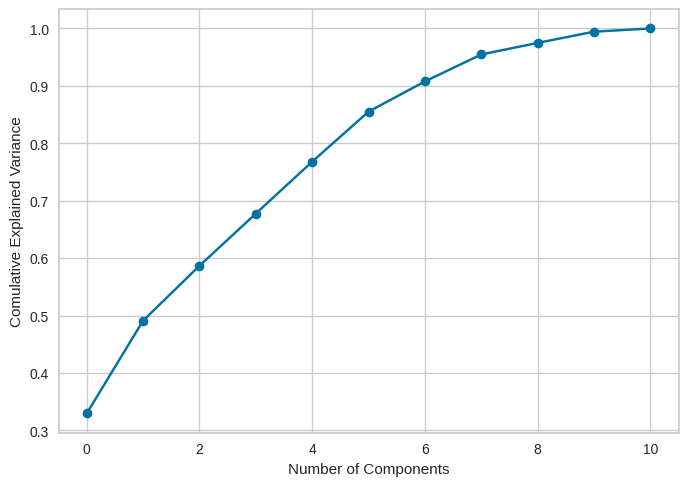

In [ ]:
# Perform Principal Component Analysis (PCA) on the training data
pca = PCA().fit(X_train)
# Plot the cumulative explained variance ratio to decide the number of components
plt.plot(pca.explained_variance_ratio_.cumsum(), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Comulative Explained Variance')
plt.show()

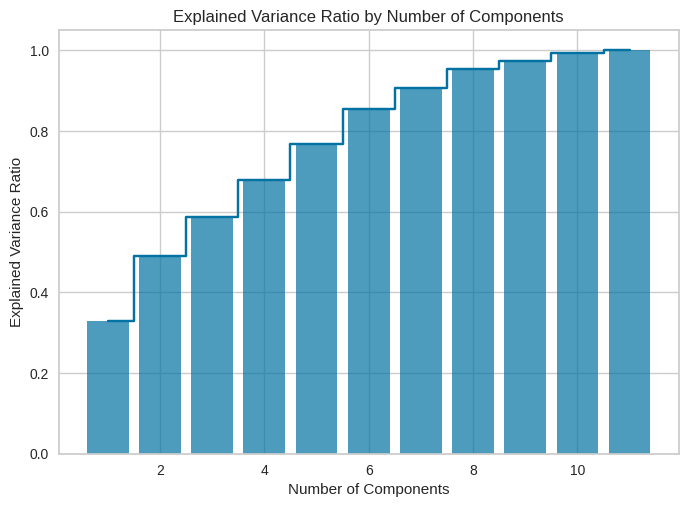

In [ ]:
# Perform Principal Component Analysis (PCA) on the training data
pca = PCA().fit(X_train)

# Plot the cumulative explained variance ratio as a bar graph
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), alpha=0.7, align='center')
plt.step(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), where='mid')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Number of Components')
plt.show()

Here, the number of components chosen for **PCA** is 5, corresponding to a cumulative explained variance ratio of (0.85510743) .

In [ ]:
# Perform PCA with the chosen number of components (e.g., 5) on both training and testing data
pca = PCA(n_components=5)
X_train = pd.DataFrame(pca.fit_transform(X_train), columns=['PC1','PC2','PC3','PC4','PC5'])
X_test= pd.DataFrame(pca.fit_transform(X_test), columns=['PC1','PC2','PC3','PC4','PC5'])

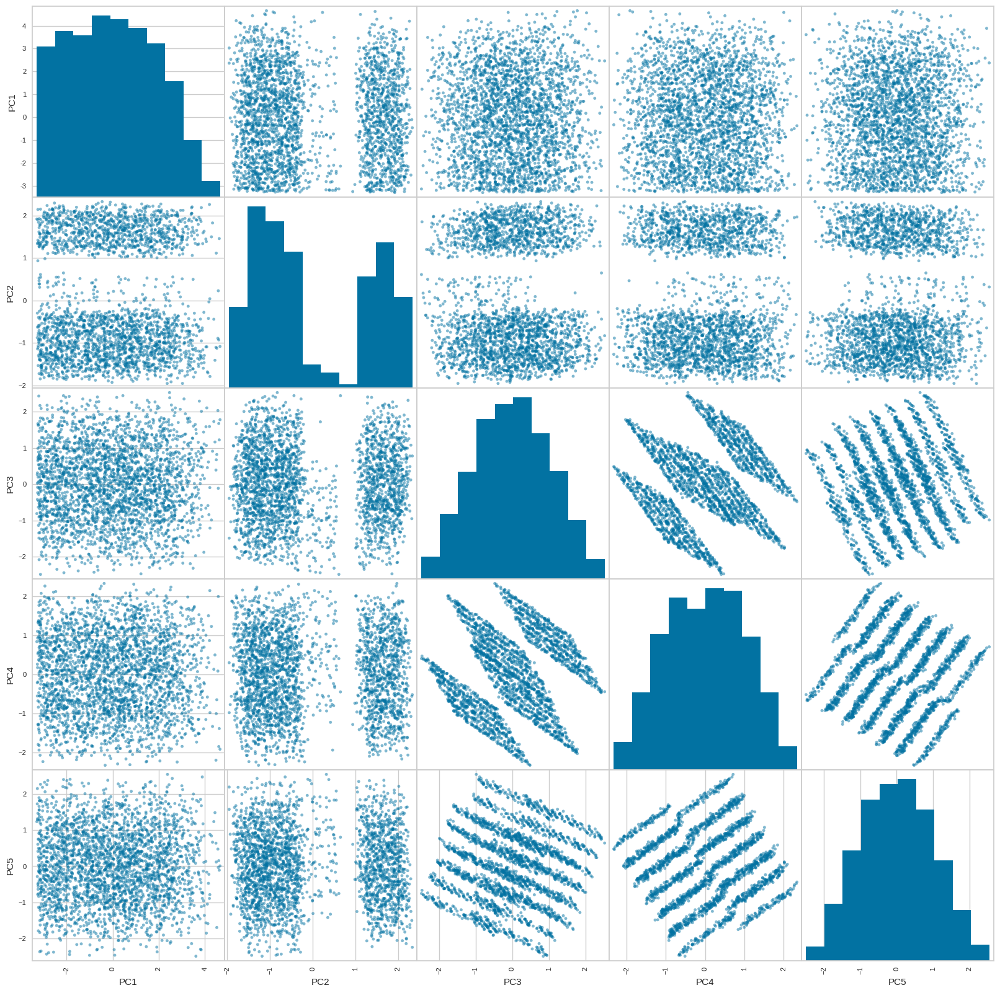

In [ ]:
scatter_matrix(X_train, figsize=(20,20))
plt.show()

## Cross Validation and Testing After PCA
In this section, hyperparameter tuning is conducted again for all regression models after applying PCA.

In [ ]:
# Define alpha values for regularization
alpha_values = [0.001, 0.01, 0.1, 0.5 ,1, 10, 100,500,1000,1500,2000,5000,10000]
l1_ratios = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

###Linear Regression Testing and Visualization

In [ ]:
# Initialize variables for Linear Regression hyperparameter (k) tuning
best_k = None
best_score = float('-inf')

# Hyperparameter tuning for the number of folds (K) in cross-validation
for k in range(2, 11):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    model = LinearRegression()
    scores = cross_val_score(model, X_train, Y_train, cv=kf, scoring='neg_mean_squared_error')
    mean_score = np.mean(scores)

    if mean_score > best_score:
        best_score = mean_score
        best_k = k

print(f"Best number of folds (K): {best_k}")

Best number of folds (K): 2


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
linear_reg= LinearRegression()

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(linear_reg, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2920136.18436356
Mean Squared Error (MSE) scores: 15728141391511.453
R-squared (R2) scores: 0.7990713436516492


Coefficients: [4154909.72707236 -122983.59872354   49696.47409334 -109387.46063225
   80222.23144435]
Mean Absolute Error (MAE): 2755172.061406646
Mean Squared Error (MSE): 13916971332860.426
Root Mean Squared Error (RMSE): 3730545.715154879
R-Squared (R2): 0.8190583665527875


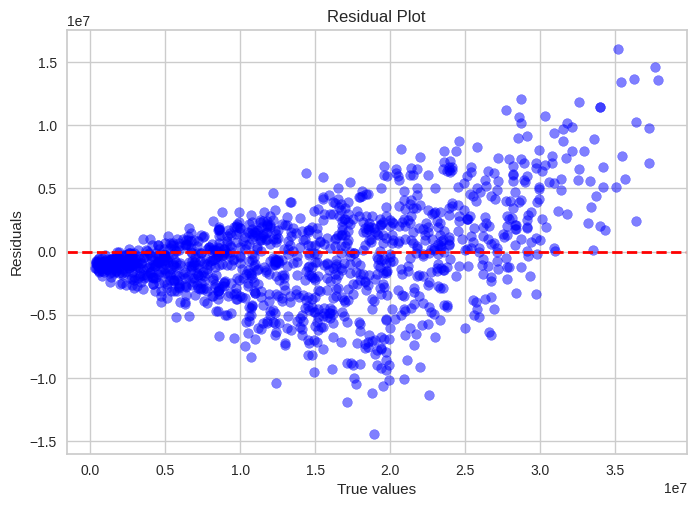

In [ ]:
# Fit the Linear Regression model on the training data
linear_reg.fit(X_train,Y_train)
predictions = linear_reg.predict(X_test)
print("Coefficients:", linear_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =linear_reg.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

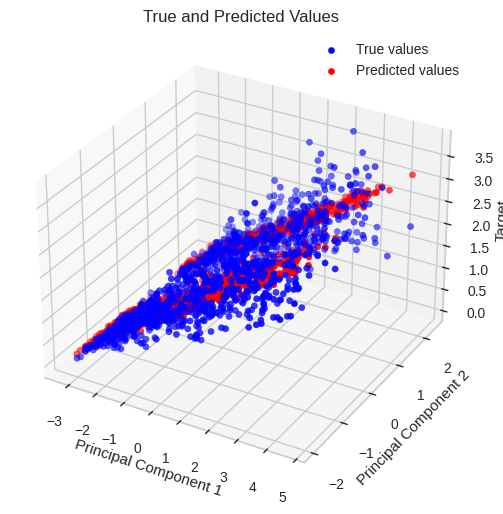

In [ ]:
# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

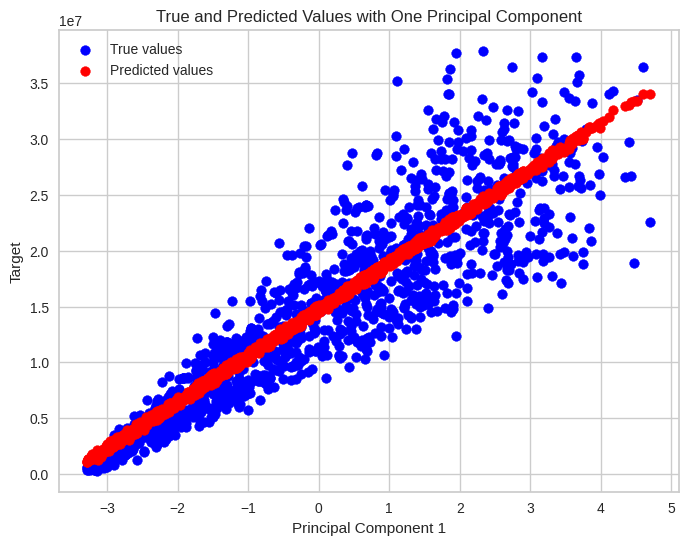

In [ ]:
# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test.iloc[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Ridge Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and alpha) for Ridge Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
        model = linear_model.Ridge(alpha)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_params = {'num_folds': num_folds,'alpha': alpha}

# Display the best hyperparameters
print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 3, 'alpha': 10}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
ridge= ridge=linear_model.Ridge(best_alpha)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(ridge, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2929200.4756097575
Mean Squared Error (MSE) scores: 15800416919396.04
R-squared (R2) scores: 0.7973063306588632


Coefficients: [4150924.70326885 -122743.44880025   49532.66846079 -109008.22809827
   79942.83892234]
Mean Absolute Error (MAE): 2756373.1003353964
Mean Squared Error (MSE): 13914258797381.088
Root Mean Squared Error (RMSE): 3730182.1399740106
R-Squared (R2): 0.8190936336082895


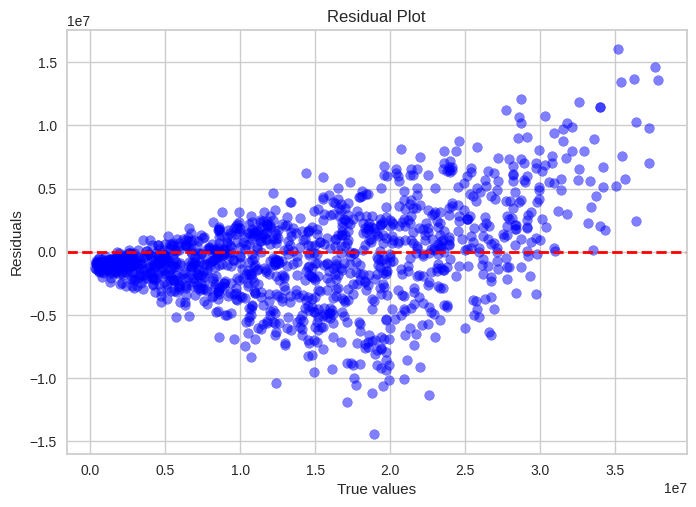

In [ ]:
# Fit the Ridge Regression model on the training data
ridge.fit(X_train,Y_train)
predictions = ridge.predict(X_test)

print("Coefficients:", ridge.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =ridge.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

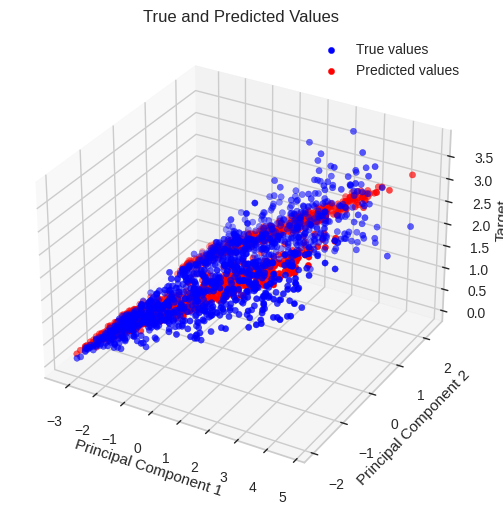

In [ ]:
# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

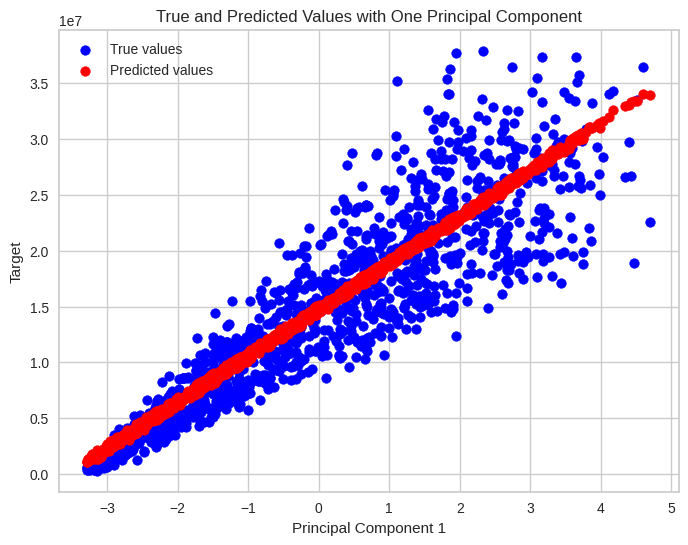

In [ ]:
# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test.iloc[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()



### Lasso Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and alpha) for Lasso Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
        model = linear_model.Lasso(alpha)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_params = {'num_folds': num_folds,'alpha': alpha}


print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 3, 'alpha': 2000}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
lasso=linear_model.Lasso(best_alpha)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(lasso, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2927717.8818997666
Mean Squared Error (MSE) scores: 15800035867105.361
R-squared (R2) scores: 0.7973088323333265


Coefficients: [4154357.70822094 -121858.60014117   47794.93634775 -107387.07303911
   78212.66182788]
Mean Absolute Error (MAE): 2755473.741682216
Mean Squared Error (MSE): 13916578608984.465
Root Mean Squared Error (RMSE): 3730493.078533247
R-Squared (R2): 0.819063472555948


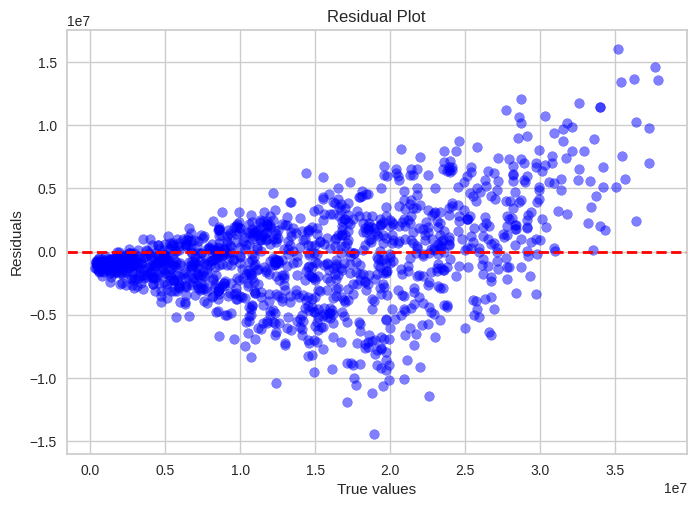

In [ ]:
# Fit the Lasso Regression model on the training data
lasso.fit(X_train,Y_train)
predictions = lasso.predict(X_test)

print("Coefficients:", lasso.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =lasso.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

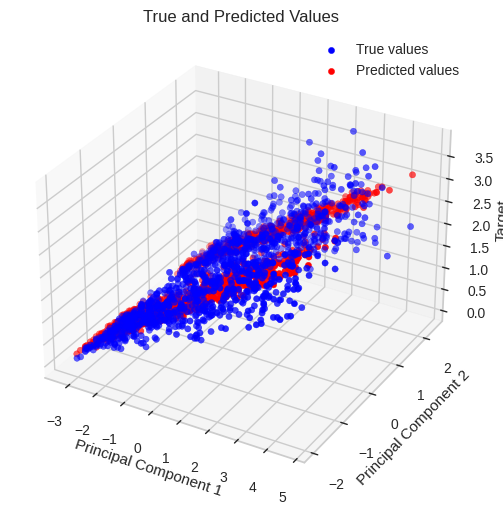

In [ ]:
# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

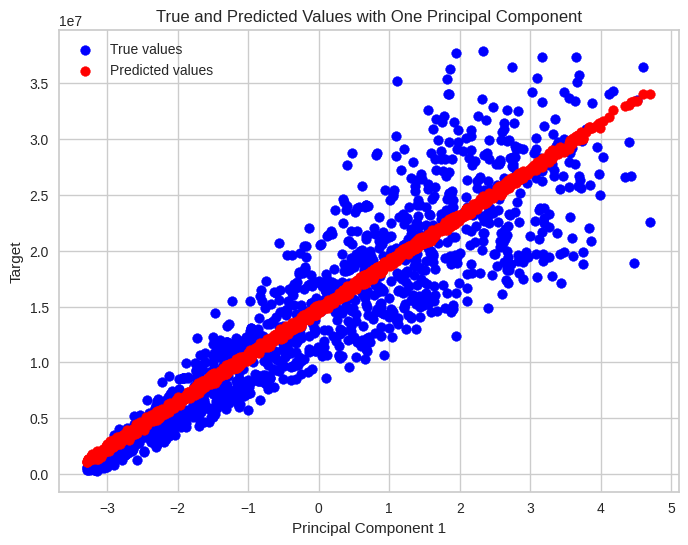

In [ ]:
# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test.iloc[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

###Elastic Net Testing and Visualization

In [ ]:
# Hyperparameter tuning (k, alpha, l1) for Elastic Net Regression
best_score = -np.inf
best_k=None
best_alpha=None
best_l1=None
best_params = {}
for num_folds in range(2, 11) :
    for alpha in alpha_values:
      for l1_ratio in l1_ratios:
        model = linear_model.ElasticNet(alpha=alpha,l1_ratio=l1_ratio)
        cv_scores = cross_val_score(model, X_train, Y_train, cv=num_folds, scoring='r2')
        mean_cv_score = np.mean(cv_scores)
        if mean_cv_score > best_score:
                best_score = mean_cv_score
                best_k=num_folds
                best_alpha=alpha
                best_l1=l1_ratio
                best_params = {'num_folds': num_folds, 'alpha': alpha,'l1_ratio': l1_ratio}


print("Best Parameters:", best_params)

Best Parameters: {'num_folds': 3, 'alpha': 0.1, 'l1_ratio': 0.9}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)
elastic=linear_model.ElasticNet(alpha=best_alpha,l1_ratio=best_l1)

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(elastic, X_train, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2930617.6919825743
Mean Squared Error (MSE) scores: 15800567716389.025
R-squared (R2) scores: 0.7973069914041729


Coefficients: [4143473.32530199 -122295.63601288   49228.34078338 -108304.11952984
   79424.0997256 ]
Mean Absolute Error (MAE): 2758683.236370042
Mean Squared Error (MSE): 13909514379921.752
Root Mean Squared Error (RMSE): 3729546.135915435
R-Squared (R2): 0.8191553181964313


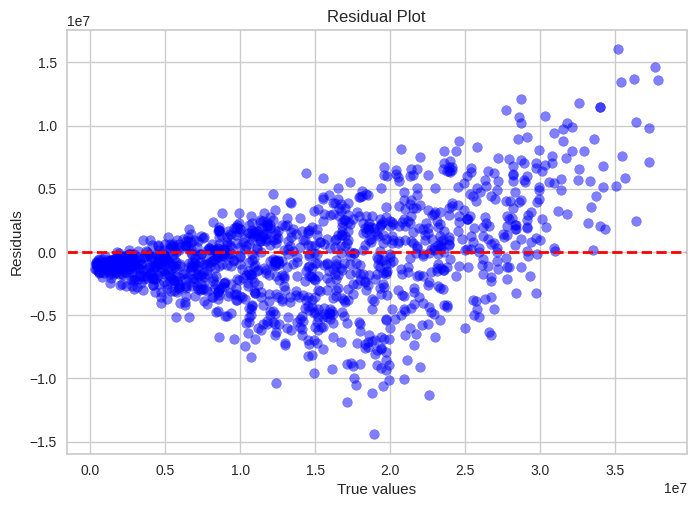

In [ ]:
# Fit the elstic net Regression model on the training data
elastic.fit(X_train,Y_train)
predictions = elastic.predict(X_test)

print("Coefficients:", elastic.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =elastic.score(X_test,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

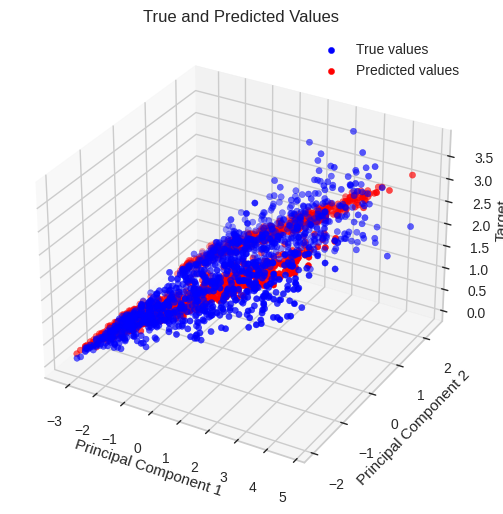

In [ ]:
# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

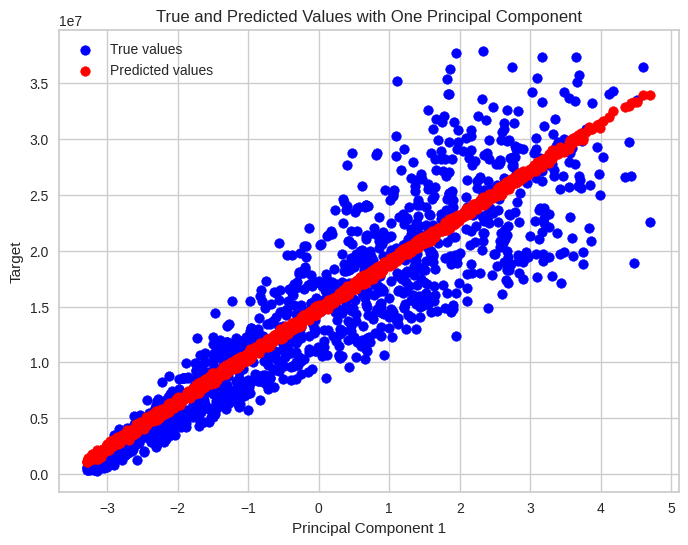

In [ ]:
# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test.iloc[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

### Polynomial Regression Testing and Visualization

In [ ]:
# Hyperparameter tuning (k and degree) for Polynomial Regression
best_k = None
best_degree=None
best_params = {}
best_score = float('-inf')

for k in range(2, 11):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    for degree in range(2, 11):
      poly_features = PolynomialFeatures(degree=degree, include_bias=False)
      X_train_poly = poly_features.fit_transform(X_train)
      X_test_poly = poly_features.transform(X_test)
      model = LinearRegression()
      scores = cross_val_score(model, X_train_poly, Y_train, cv=kf, scoring='neg_mean_squared_error')
      mean_score = np.mean(scores)
      if mean_score > best_score:
        best_score = mean_score
        best_k = k
        best_degree=degree
        best_params = {'num_folds': num_folds, 'degree':degree}


print("Best Parameters:", {'num_folds': num_folds, 'degree':degree})

Best Parameters: {'num_folds': 10, 'degree': 3}


In [ ]:
# Create the best KFold object
kf_best = KFold(n_splits=best_k, shuffle=True, random_state=42)

# Create the polynomial features
poly_features = PolynomialFeatures(degree=best_degree, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

polynomial_reg= LinearRegression()

# Calculate mean scores for MAE, MSE, and R-squared using cross-validation
mean_mae_score =np.mean( -cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='neg_mean_absolute_error'))
mean_mse_score =np.mean( -cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='neg_mean_squared_error'))
mean_r2_score =np.mean( cross_val_score(linear_reg, X_train_poly, Y_train, cv=kf_best, scoring='r2'))


# Display the cross-validation scores
print(f"Mean Absolute Error (MAE) scores: {mean_mae_score}")
print(f"Mean Squared Error (MSE) scores: {mean_mse_score}")
print(f"R-squared (R2) scores: {mean_r2_score}")

Mean Absolute Error (MAE) scores: 2892411.477514355
Mean Squared Error (MSE) scores: 15198499503305.025
R-squared (R2) scores: 0.8041231144211842


[4736575.6601823  -176198.76717227  246381.75352473   39088.45564692
  611225.50141875 -130061.02283037  -20134.86852559   -5084.67493334
  -50311.53932493  -23846.00234261 -310452.06241547   12920.94808725
  -98493.19654386 -168467.77155608  -80818.38102731  115096.60525923
  116438.0870689    58887.00957497  136656.5843862     7626.46712607
  -48291.26844448   -5496.07176637  -45273.8284724    22097.61763706
  -35495.49979047  -86694.1096897   -26999.77593138  -26506.55113914
 -105606.68249943  -54059.40040507   94832.25422089   11453.28843066
   12488.07553153   70541.45998893   14571.63039434   28140.47166392
   94001.33801729  -24403.87858116  -88168.62378091  -30462.92420133
  162262.63010821   58617.55873442  147015.47983914  225995.63088729
  -12506.72135661  -17081.50185811   64788.87133663 -124366.70786368
   13519.16277122  255975.69769664 -155001.43146331 -110429.75804102
 -164653.3751037   -13502.10506503  -44819.92413911]
Coefficients: [4736575.6601823  -176198.76717227  

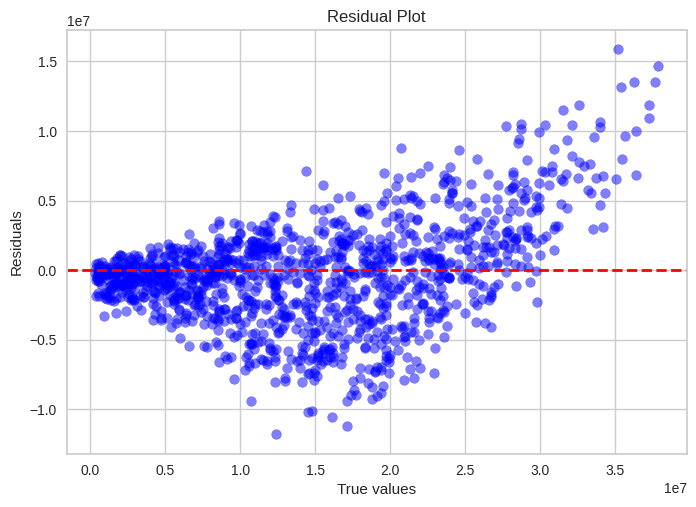

In [ ]:
# Fit the Polynomial Regression model on the training data
polynomial_reg.fit(X_train_poly,Y_train)
predictions = polynomial_reg.predict(X_test_poly)
print(polynomial_reg.coef_)

print("Coefficients:", polynomial_reg.coef_)
# Check Mean Absolute Error
mae = metrics.mean_absolute_error(Y_test, predictions)
print("Mean Absolute Error (MAE):", mae)
# Check Mean squared Error
mse = metrics.mean_squared_error(Y_test,predictions)
print("Mean Squared Error (MSE):", mse)
# Calculate and print Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
# R-Squared
r2 =polynomial_reg.score(X_test_poly,Y_test)
print("R-Squared (R2):", r2)
#Residual plot
residuals = Y_test - predictions

# Create a residual plot using Matplotlib
plt.scatter(Y_test, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Add a horizontal line at y=0
plt.title('Residual Plot')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.show()

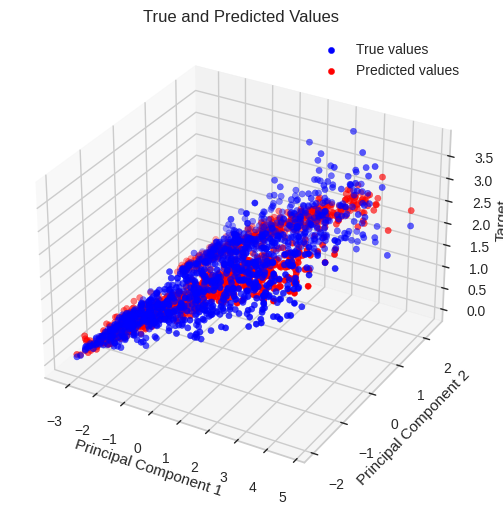

In [ ]:
# Visualize the results
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of true values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Target')
ax.set_title('True and Predicted Values')

plt.legend()
plt.show()

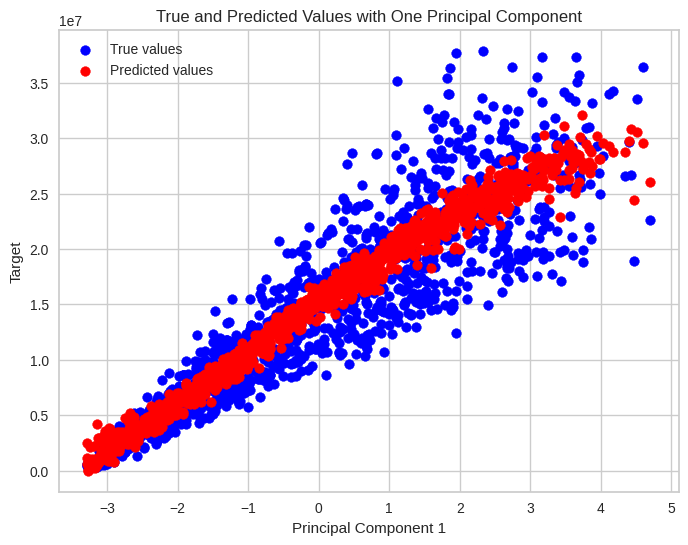

In [ ]:
# Visualize the results in a 2D plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(X_test.iloc[:, 0], Y_test, c='blue', marker='o', label='True values')

# Scatter plot of predicted values
ax.scatter(X_test.iloc[:, 0], predictions, c='red', marker='o', label='Predicted values')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Target')
ax.set_title('True and Predicted Values with One Principal Component')

plt.legend()
plt.show()

###Conclusions:

1. **Performance Change:**
   - Across all regression algorithms, there is a noticeable decrease in performance metrics (lower $R^2$ and higher error values) when using PCA for feature selection and extraction compared to the normal correlation and variance analysis methods.

2. **PCA Trade-offs:**
   - While PCA is effective in reducing dimensionality, it might not capture all the nuances present in the original feature set, leading to a decrease in predictive power.

3. **Model Sensitivity:**
   - The impact of changing feature selection methods is more prominent in simpler models like linear and ridge regression, highlighting the sensitivity of these models to feature selection choices.

  In summary, the choice of feature selection method significantly influences model performance, and the decision should be tailored to the specific characteristics of the dataset and the underlying assumptions of the regression models.

#Clustering pipeline


### Data Preprocessing

In [ ]:
# Read the dataset
loan=pd.read_csv('/content/loan_approval_dataset.csv')
loan.columns = loan.columns.str.strip()
loan_status=loan['loan_status']
#loan=loan.drop(['loan_amount','loan_status'],axis=1)
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   loan_id                   4269 non-null   int64 
 1   no_of_dependents          4269 non-null   int64 
 2   education                 4269 non-null   object
 3   self_employed             4269 non-null   object
 4   income_annum              4269 non-null   int64 
 5   loan_amount               4269 non-null   int64 
 6   loan_term                 4269 non-null   int64 
 7   cibil_score               4269 non-null   int64 
 8   residential_assets_value  4269 non-null   int64 
 9   commercial_assets_value   4269 non-null   int64 
 10  luxury_assets_value       4269 non-null   int64 
 11  bank_asset_value          4269 non-null   int64 
 12  loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [ ]:
# convert categorical features into binary values
loan['IsGraduate'] = loan['education'].map({' Graduate': 1, ' Not Graduate': 0})
print(loan['IsGraduate'])
loan = loan.drop('education', axis=1)
loan['self_employed']= loan['self_employed'].map({' Yes': 1, ' No': 0})
loan['loan_approved']= loan['loan_status'].map({' Approved': 1, ' Rejected': 0})
loan = loan.drop('loan_status', axis=1)
# drop loan id
loan=loan.drop(['loan_id'],axis=1)

0       1
1       0
2       1
3       1
4       0
       ..
4264    1
4265    0
4266    0
4267    0
4268    1
Name: IsGraduate, Length: 4269, dtype: int64


In [ ]:
# Outlier removal using IQR
count = -1
while True:
  count +=1
  prev_length = len(loan)
  Q1 = loan['commercial_assets_value'].quantile(0.25)
  Q3 = loan['commercial_assets_value'].quantile(0.75)
  IQR = Q3 - Q1
  print(IQR)
  outliers = (loan['commercial_assets_value'] > Q3 + 1.5 * IQR) | (loan['commercial_assets_value'] < Q1 - 1.5 * IQR)
  loan = loan.loc[~outliers]

  Q1 = loan['residential_assets_value'].quantile(0.25)
  Q3 = loan['residential_assets_value'].quantile(0.75)
  IQR = Q3 - Q1

  outliers = (loan['residential_assets_value'] > Q3 + 1.5 * IQR) |(loan['residential_assets_value'] < Q1 - 1.5 * IQR)
  loan = loan.loc[~outliers]

  Q1 = loan['bank_asset_value'].quantile(0.25)
  Q3 = loan['bank_asset_value'].quantile(0.75)
  IQR = Q3 - Q1

  outliers = (loan['bank_asset_value'] > Q3 + 1.5 * IQR)|(loan['bank_asset_value'] < Q1 - 1.5 * IQR)
  loan = loan.loc[~outliers]
  new_length = len(loan)
  if prev_length == new_length:
    break
print(count)
loan.info()

6300000.0
6100000.0
6000000.0
6000000.0
3
<class 'pandas.core.frame.DataFrame'>
Int64Index: 4108 entries, 1 to 4268
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   no_of_dependents          4108 non-null   int64
 1   self_employed             4108 non-null   int64
 2   income_annum              4108 non-null   int64
 3   loan_amount               4108 non-null   int64
 4   loan_term                 4108 non-null   int64
 5   cibil_score               4108 non-null   int64
 6   residential_assets_value  4108 non-null   int64
 7   commercial_assets_value   4108 non-null   int64
 8   luxury_assets_value       4108 non-null   int64
 9   bank_asset_value          4108 non-null   int64
 10  IsGraduate                4108 non-null   int64
 11  loan_approved             4108 non-null   int64
dtypes: int64(12)
memory usage: 417.2 KB


In [ ]:
# Standardizing the data
scaler = StandardScaler()
loan_standard = scaler.fit_transform(loan)
loan = pd.DataFrame(loan_standard, columns=loan.columns)

### K-Means clustering
This section performs k-means clustering using the elbow method, Silhouette Score, and Davies-Bouldin Score. It provides insights into optimal cluster numbers and visualizations, including a 3D PCA plot.

In [ ]:
# Compute Within Cluster Sum of Squares (WCSS)
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(loan)
    wcss.append(kmeans.inertia_)

<ipython-input-302-d0f2faf5fb0b>:2: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bx-" (-> marker='x'). The keyword argument will take precedence.
  plt.plot(range(1, 11), wcss, 'bx-', marker='o')


Text(0, 0.5, 'WCSS')

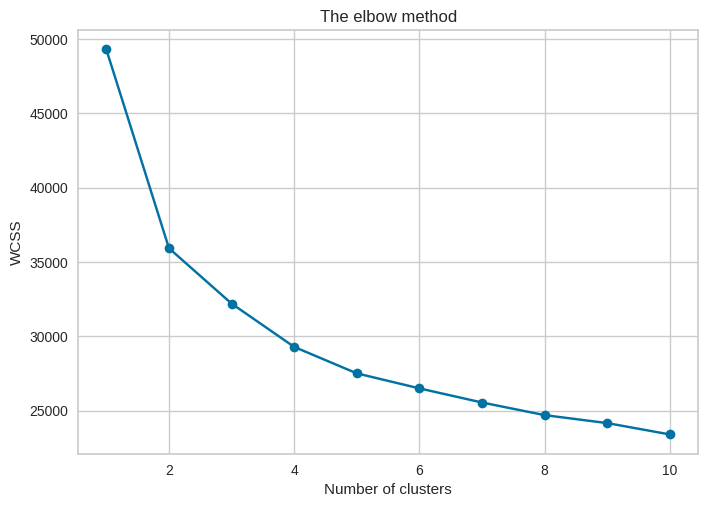

In [ ]:
# Plotting the Elbow Method
plt.plot(range(1, 11), wcss, 'bx-', marker='o')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares

In [ ]:
# Evaluate clustering quality for different number of clusters using Silhouette Score and Davies-Bouldin Score
avg_silhouette_list = []
davies_bouldin_score_list = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(loan)
    cluster_labels = kmeans.labels_
    davies_bouldin = davies_bouldin_score(loan,cluster_labels)
    avg_silhouette = silhouette_score(loan, cluster_labels)
    avg_silhouette_list.append(avg_silhouette)
    davies_bouldin_score_list.append(davies_bouldin)
    print(f"For {i} clusters:\nDavies-Bouldin Score: {davies_bouldin}")
    print(f"Average Silhouette Score: {avg_silhouette}")
    print()

For 2 clusters:
Davies-Bouldin Score: 1.6217645102005371
Average Silhouette Score: 0.22944979393649992

For 3 clusters:
Davies-Bouldin Score: 1.7364608943187125
Average Silhouette Score: 0.17576903764020954

For 4 clusters:
Davies-Bouldin Score: 1.9976627903120368
Average Silhouette Score: 0.1613789397973211

For 5 clusters:
Davies-Bouldin Score: 1.9809174727091652
Average Silhouette Score: 0.1490223049842608

For 6 clusters:
Davies-Bouldin Score: 2.008854183739769
Average Silhouette Score: 0.14432817436806097

For 7 clusters:
Davies-Bouldin Score: 2.154822796732046
Average Silhouette Score: 0.12221341619395121

For 8 clusters:
Davies-Bouldin Score: 2.1720104443025834
Average Silhouette Score: 0.12328585388632766

For 9 clusters:
Davies-Bouldin Score: 2.3116417391762973
Average Silhouette Score: 0.1163902766538542

For 10 clusters:
Davies-Bouldin Score: 2.3220084238216385
Average Silhouette Score: 0.12407272198735343



Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

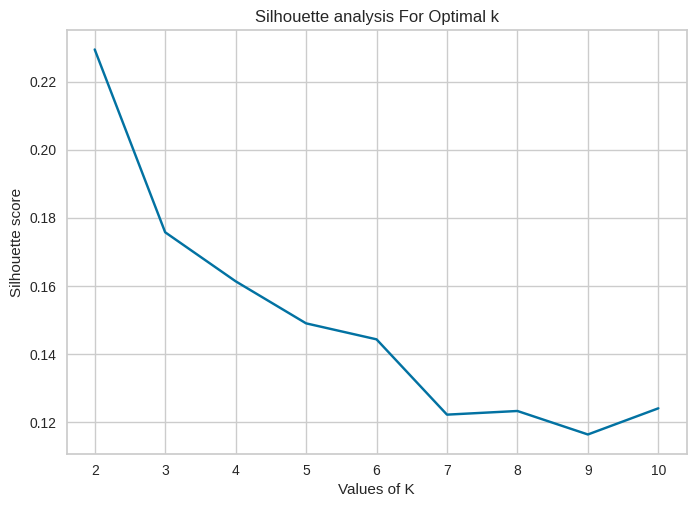

In [ ]:
# Plotting Silhouette Score analysis for optimal K
plt.plot(range(2, 11),avg_silhouette_list, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

Text(0.5, 1.0, 'Davies-Bouldin Score analysis For Optimal k')

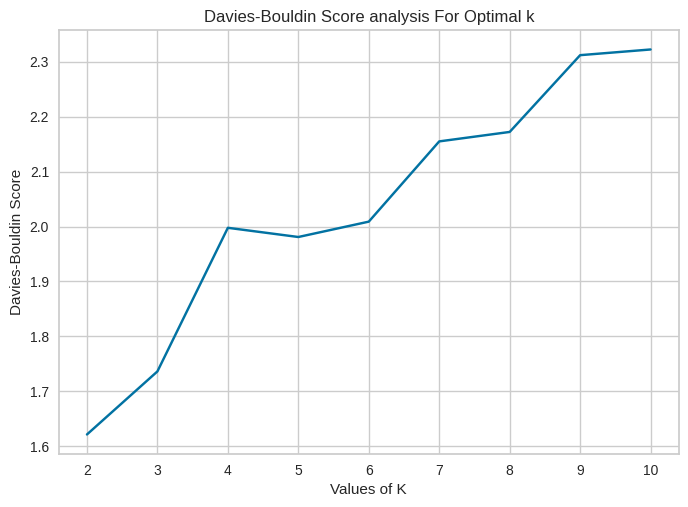

In [ ]:
# Plotting Davies-Bouldin Score analysis for optimal K
plt.plot(range(2, 11),davies_bouldin_score_list, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score analysis For Optimal k')

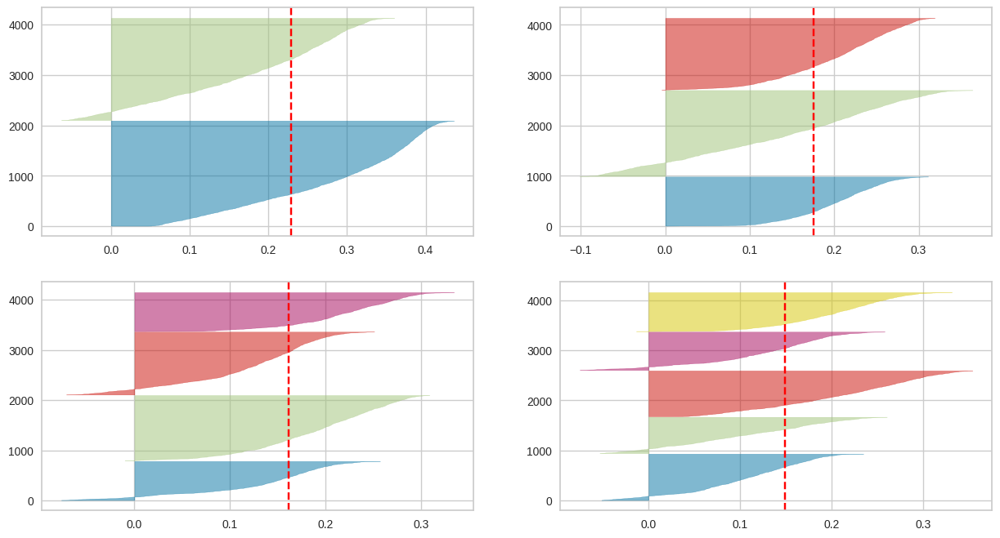

In [ ]:
# Visualize Silhouette Scores for normalized dataset
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loan)

Analyzing both **Silhouette Scores** and **Davies-Bouldin Scores**, It is evident that k = 2 is the best number of clusters.

In [ ]:
# Fit K-Means with optimal K
km = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(loan)
clusters = km.labels_
score = silhouette_score(loan, km.labels_)
db_score = davies_bouldin_score(loan, km.labels_)

print('Silhouette Score: %.3f' % score)
print('DB Score: %.3f' % db_score)

Silhouette Score: 0.229
DB Score: 1.622


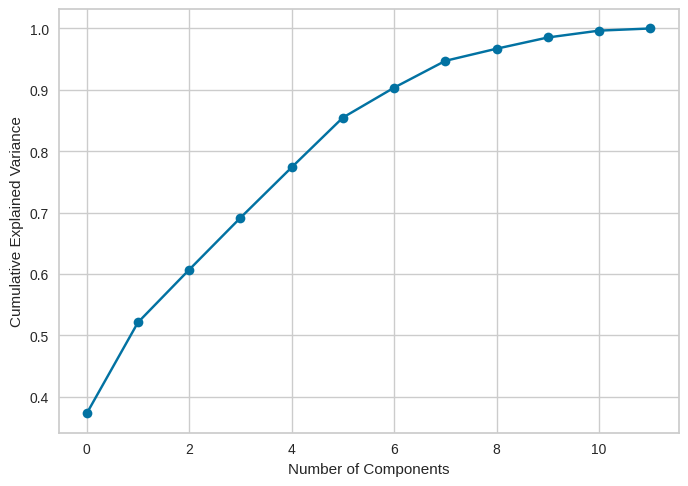

In [ ]:
# Perform Principal Component Analysis (PCA) on the training data
pca = PCA()
pca = pca.fit(loan)
# Plot the cumulative explained variance ratio to decide the number of components
plt.plot(pca.explained_variance_ratio_.cumsum(), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

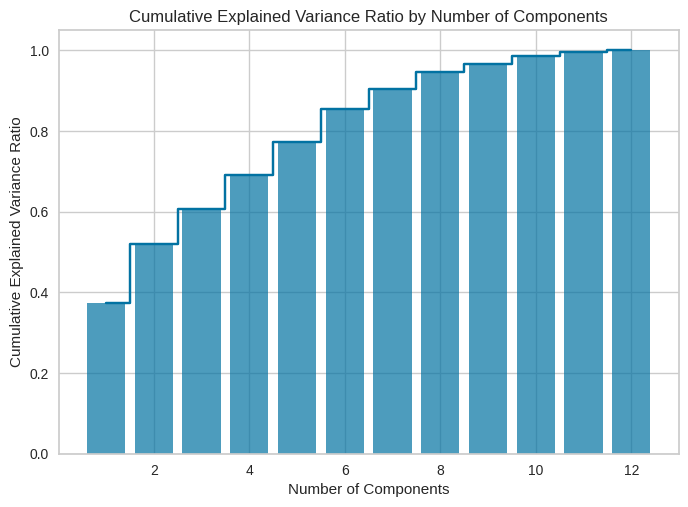

In [ ]:
# Perform Principal Component Analysis (PCA) on the training data
pca = PCA().fit(loan)

# Plot the cumulative explained variance ratio as a bar graph
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), alpha=0.7, align='center')
plt.step(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), where='mid')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Number of Components')
plt.show()

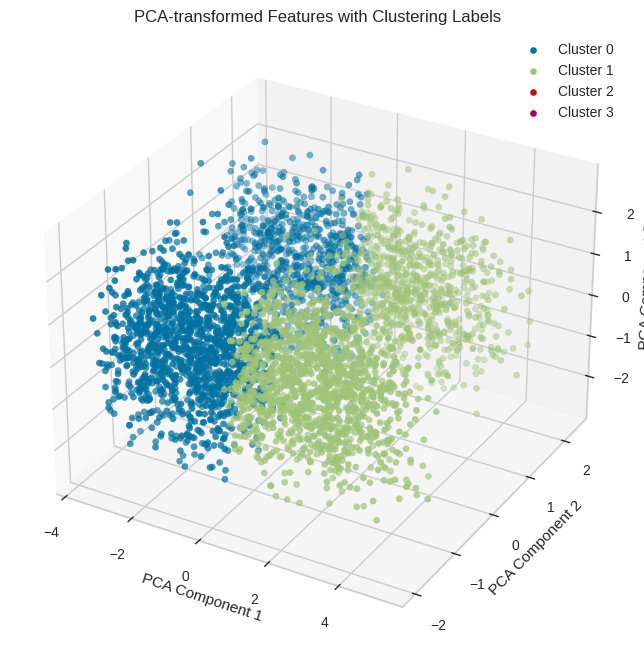

In [ ]:
# visualize clustering in 3D space using PCA
pca = PCA(n_components=3)
transformed_data = pca.fit_transform(loan)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of the PCA-transformed features colored by clustering label
for i in range(4):
    ax.scatter(transformed_data[clusters == i, 0],
               transformed_data[clusters == i, 1],
               transformed_data[clusters == i, 2],
               label=f'Cluster {i}')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('PCA-transformed Features with Clustering Labels')
ax.legend()

plt.show()

### Agglomerative Clustering
Agglomerative Clustering is assessed using Silhouette and Davies-Bouldin Scores, accompanied by silhouette plots and hierarchical dendrograms for visual interpretation. A 3D PCA visualization is included.

In [ ]:
# Evaluate clustering quality using Silhouette Score and Davies-Bouldin Score
avg_silhouette_list = []
davies_bouldin_score_list = []
for i in range(2, 11):
    model = AgglomerativeClustering(n_clusters=i, linkage='complete')
    cluster_labels = model.fit_predict(loan)
    davies_bouldin = davies_bouldin_score(loan,cluster_labels)
    avg_silhouette = silhouette_score(loan, cluster_labels)
    avg_silhouette_list.append(avg_silhouette)
    davies_bouldin_score_list.append(davies_bouldin)
    print(f"For {i} clusters:\nDavies-Bouldin Score: {davies_bouldin}")
    print(f"Average Silhouette Score: {avg_silhouette}")
    print()

For 2 clusters:
Davies-Bouldin Score: 1.728082036847068
Average Silhouette Score: 0.21340602077473214

For 3 clusters:
Davies-Bouldin Score: 2.3965488687360392
Average Silhouette Score: 0.09303664991088807

For 4 clusters:
Davies-Bouldin Score: 2.1300519417232064
Average Silhouette Score: 0.09246068929629159

For 5 clusters:
Davies-Bouldin Score: 2.7464568984781343
Average Silhouette Score: 0.0814616562081564

For 6 clusters:
Davies-Bouldin Score: 2.7003302489491845
Average Silhouette Score: 0.07752350712184633

For 7 clusters:
Davies-Bouldin Score: 2.683309278325105
Average Silhouette Score: 0.0693698938082969

For 8 clusters:
Davies-Bouldin Score: 2.671753951908249
Average Silhouette Score: 0.041687768867774325

For 9 clusters:
Davies-Bouldin Score: 2.6215830869441064
Average Silhouette Score: 0.042832993778080385

For 10 clusters:
Davies-Bouldin Score: 2.5550050083171243
Average Silhouette Score: 0.041929959995144775



Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

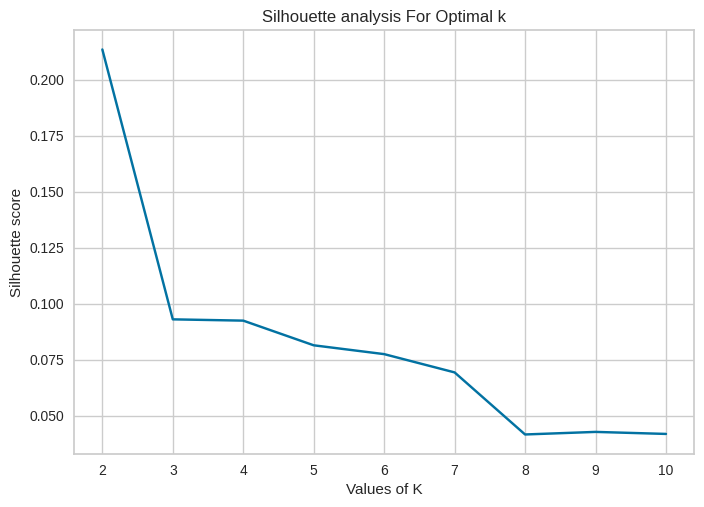

In [ ]:
# Plotting Silhouette Score analysis for optimal K
plt.plot(range(2, 11),avg_silhouette_list, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

Text(0.5, 1.0, 'Davies-Bouldin Score analysis For Optimal k')

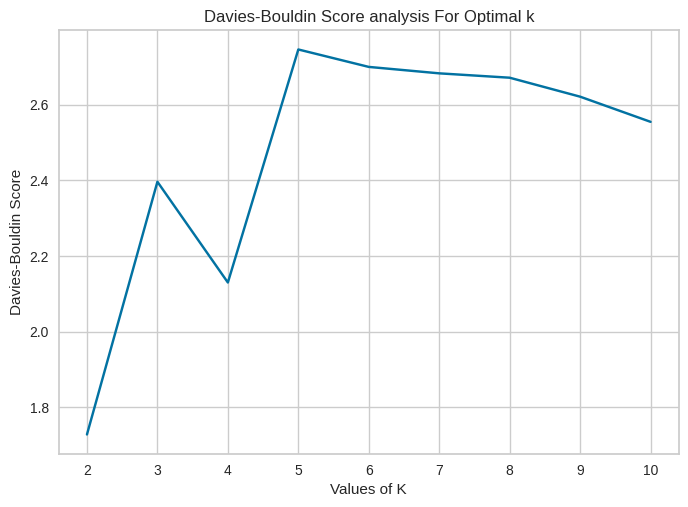

In [ ]:
# Plotting Davies-Bouldin Score analysis for optimal K
plt.plot(range(2, 11),davies_bouldin_score_list, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score analysis For Optimal k')

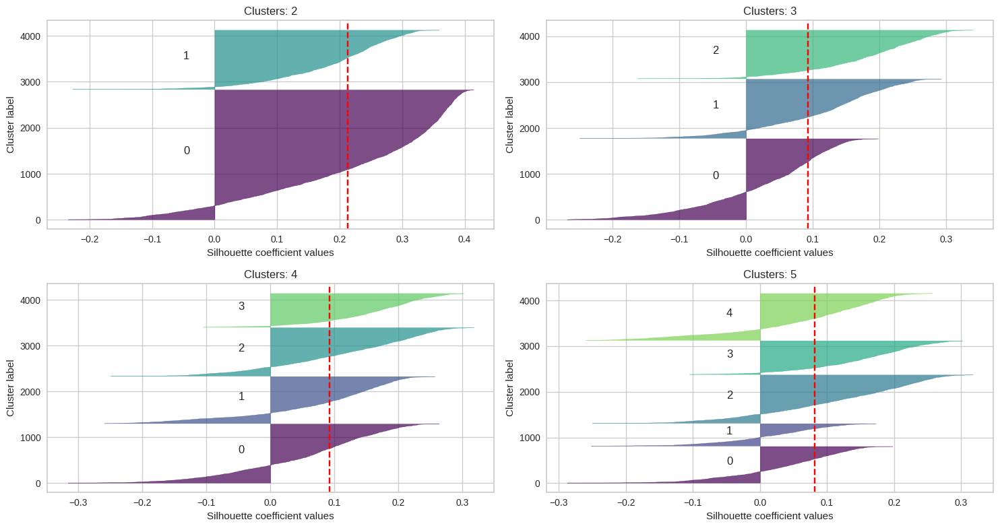

In [ ]:
# Visualize silhouette plots for different number of clusters
# Set up subplots
fig, ax = plt.subplots(2, 2, figsize=(15, 8))

# Loop through different cluster values
for i in range(2, 6):
    q, mod = divmod(i, 2)

    # Fit Agglomerative Clustering
    model = AgglomerativeClustering(n_clusters=i, linkage='complete')
    labels = model.fit_predict(loan)

    # Compute silhouette scores
    silhouette_vals = silhouette_samples(loan, labels)

    # Visualize silhouette scores
    y_lower = 10
    for cluster in range(i):
        cluster_silhouette_vals = silhouette_vals[labels == cluster]
        cluster_silhouette_vals.sort()

        y_upper = y_lower + len(cluster_silhouette_vals)

        color = plt.cm.viridis(float(cluster) / i)
        ax[q-1][mod].fill_betweenx(np.arange(y_lower, y_upper),
                                   0, cluster_silhouette_vals,
                                   facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax[q-1][mod].text(-0.05, y_lower + 0.5 * len(cluster_silhouette_vals), str(cluster))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10

    # Set labels and title for each subplot
    ax[q-1][mod].set_title(f'Clusters: {i}')
    ax[q-1][mod].set_xlabel("Silhouette coefficient values")
    ax[q-1][mod].set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax[q-1][mod].axvline(x=silhouette_score(loan, labels), color="red", linestyle="--")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

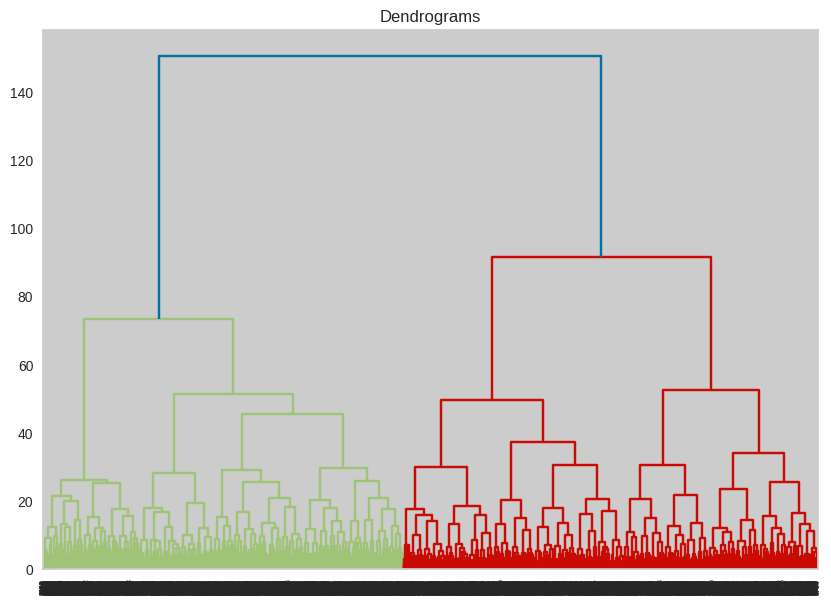

In [ ]:
# Dendrogram for hierarchical clustering
plt.figure(figsize=(10,7))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(loan, method='ward'))

Analyzing both **Silhouette Scores** and **Davies-Bouldin Scores**, It is evident that k = 2 is also the best number of clusters the same as k-means clustering.

In [ ]:
# Fit Agglomerative Clustering with optimal K
agg = AgglomerativeClustering(n_clusters=2, linkage='complete')
cluster_labels = agg.fit_predict(loan)
print('Silhouette Score: %.3f' % silhouette_score(loan, cluster_labels))
print('DB Score: %.3f' % davies_bouldin_score(loan,cluster_labels))

Silhouette Score: 0.213
DB Score: 1.728


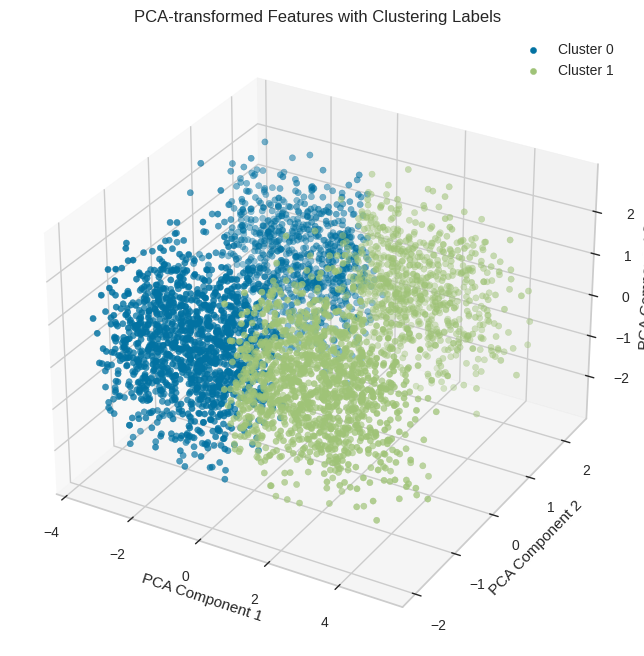

In [ ]:
# PCA transformation for visualization in 3D space
pca = PCA(n_components=3)
transformed_data = pca.fit_transform(loan)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of the PCA-transformed features colored by clustering label
for i in range(2):
    ax.scatter(transformed_data[clusters == i, 0],
               transformed_data[clusters == i, 1],
               transformed_data[clusters == i, 2],
               label=f'Cluster {i}')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('PCA-transformed Features with Clustering Labels')
ax.legend()

plt.show()

### DBSCAN
The DBSCAN section explores various epsilon and min_samples combinations, evaluating clustering quality. It includes 3D plots for Silhouette analysis, Silhouette plots for specific parameters, and a final 3D PCA visualization of the clusters with optimal parameters.

In [ ]:
# Evaluate clustering quality using Silhouette Score and Davies-Bouldin Score
avg_silhouette_list = []
davies_bouldin_score_list = []
eps_list = [0.5, 0.7, 1.0, 1.2, 1.5, 2.0, 2.5, 3.0, 4.0]
min_samples_list = [3, 5, 7, 10]
data = []
# Loop through different combinations of epsilon and min_samples
for eps in eps_list:
  for min_samples in min_samples_list:
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(loan)
    cluster_labels_count = [cluster_label for cluster_label in cluster_labels if cluster_label != -1]
    # number of clusters
    clusters_count = len(set(cluster_labels_count))
    # number of outliers
    outliers_count = sum(1 for cluster_label in cluster_labels if cluster_label == -1)
    # Skip cases where all samples are considered 1 cluster, all samples are considered outliers (0 cluster), or each sample is considered its own cluster (n clusters)
    if(clusters_count < 2 or clusters_count == len(cluster_labels)):
      print(f"For epsilon: {eps}, min_samples: {min_samples} :\n number of clusters is {clusters_count}")
      print(f"Number of outliers is {outliers_count}")
      print()
      continue
    # Compute Silhouette Score and Davies-Bouldin Score
    davies_bouldin = davies_bouldin_score(loan,cluster_labels)
    avg_silhouette = silhouette_score(loan, cluster_labels)
    avg_silhouette_list.append((avg_silhouette,eps,min_samples))
    davies_bouldin_score_list.append((davies_bouldin,eps,min_samples))
    data.append((eps,min_samples,avg_silhouette,davies_bouldin,clusters_count,outliers_count))
    print(f"For epsilon: {eps}, min_samples: {min_samples}  :\nDavies-Bouldin Score: {davies_bouldin}")
    print(f"Average Silhouette Score: {avg_silhouette}")
    print(f"number of clusters is {clusters_count}")
    print(f"Number of outliers is {outliers_count}")
    print()
# Sort data based on Silhouette Score in descending order, where each element in data is: (epsilon, min_samples, avg_silhouette, davies_bouldin, clusters_count, outliers_count)
data.sort(key=lambda x:x[2], reverse=True)
print(data)

For epsilon: 0.5, min_samples: 3  :
Davies-Bouldin Score: 0.9217103182256665
Average Silhouette Score: -0.19171310585612464
number of clusters is 28
Number of outliers is 3999

For epsilon: 0.5, min_samples: 5  :
Davies-Bouldin Score: 1.0452540217254211
Average Silhouette Score: -0.08335398285020376
number of clusters is 2
Number of outliers is 4098

For epsilon: 0.5, min_samples: 7 :
 number of clusters is 0
Number of outliers is 4108

For epsilon: 0.5, min_samples: 10 :
 number of clusters is 0
Number of outliers is 4108

For epsilon: 0.7, min_samples: 3  :
Davies-Bouldin Score: 1.010985549598572
Average Silhouette Score: -0.2708392387848421
number of clusters is 87
Number of outliers is 3664

For epsilon: 0.7, min_samples: 5  :
Davies-Bouldin Score: 0.9886133295105797
Average Silhouette Score: -0.16112759792602413
number of clusters is 15
Number of outliers is 3985

For epsilon: 0.7, min_samples: 7  :
Davies-Bouldin Score: 0.9529550298315163
Average Silhouette Score: -0.089922135508

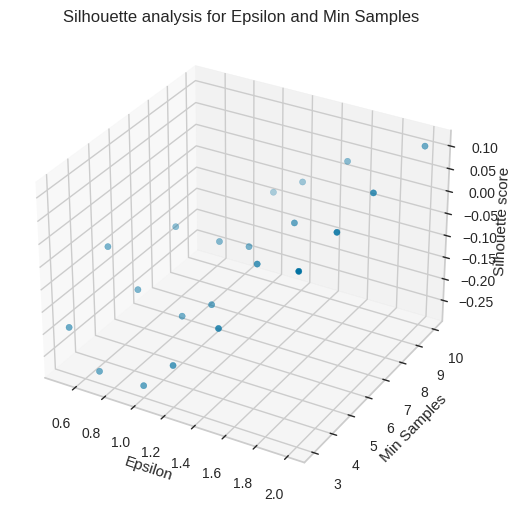

In [ ]:
# Extracting values for plotting
epsilons = [entry[1] for entry in avg_silhouette_list]
min_samples_values = [entry[2] for entry in avg_silhouette_list]
silhouette_scores = [entry[0] for entry in avg_silhouette_list]

# Create a 3D plot for Silhouette analysis
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plotting against both epsilon and min_samples
ax.scatter(epsilons, min_samples_values, silhouette_scores, c='b', marker='o')

# Set labels for the axes
ax.set_xlabel('Epsilon')
ax.set_ylabel('Min Samples')
ax.set_zlabel('Silhouette score')

# Set title for the plot
ax.set_title('Silhouette analysis for Epsilon and Min Samples')

plt.show()

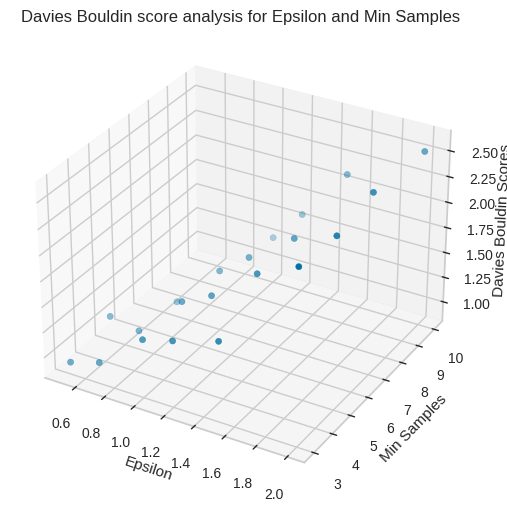

In [ ]:
# Extracting values for plotting
epsilons = [entry[1] for entry in davies_bouldin_score_list]
min_samples_values = [entry[2] for entry in davies_bouldin_score_list]
davies_bouldin_scores = [entry[0] for entry in davies_bouldin_score_list]

# Create a 3D plot for davies bouldin score analysis
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plotting against both epsilon and min_samples
ax.scatter(epsilons, min_samples_values, davies_bouldin_scores, c='b', marker='o')

# Set labels for the axes
ax.set_xlabel('Epsilon')
ax.set_ylabel('Min Samples')
ax.set_zlabel('Davies Bouldin Scores')

# Set title for the plot
ax.set_title('Davies Bouldin score analysis for Epsilon and Min Samples')

plt.show()

Analyzing the **Silhouette score** and **davies bouldin score**, and also the data list which includes: (epsilon, min_samples, avg_silhouette, davies_bouldin, clusters_count, outliers_count), we decided to choose epsilon = 2 as it gives the most reasonable output for the evaluation criteria and also the **clusters count** and **outliers count**.

Text(0.5, 1.0, 'Silhouette analysis For Optimal minimum samples')

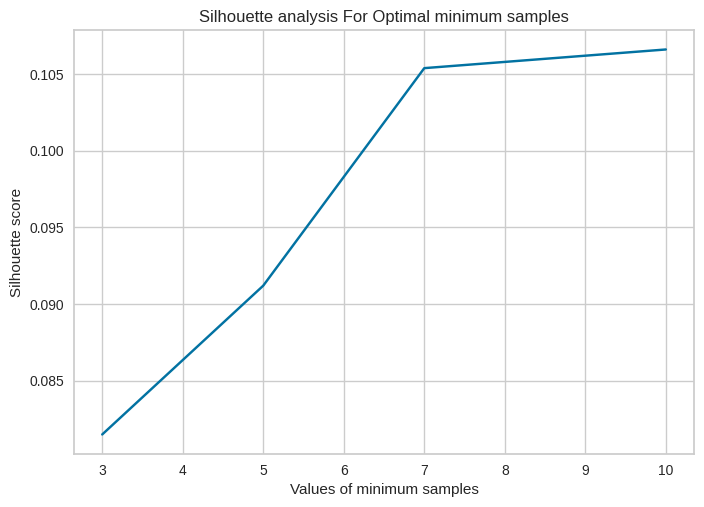

In [ ]:
# Plotting Silhouette Score analysis for optimal min samples
avg_silhouette_list_x = [silhouette_score[2] for silhouette_score in avg_silhouette_list if silhouette_score[1]==2]
avg_silhouette_list_y = [silhouette_score[0] for silhouette_score in avg_silhouette_list if silhouette_score[1]==2]
plt.plot(avg_silhouette_list_x,avg_silhouette_list_y, 'bx-')
plt.xlabel('Values of minimum samples')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal minimum samples')

Text(0.5, 1.0, 'Davies-Bouldin Score analysis For Optimal minimum samples')

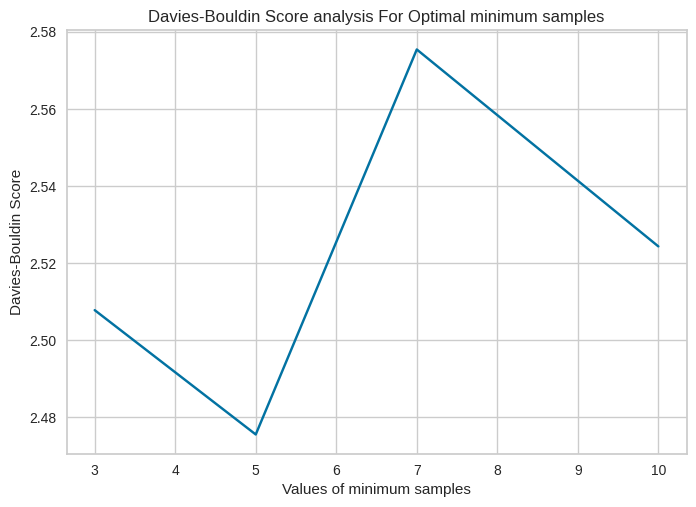

In [ ]:
# Plotting Davies-Bouldin Score analysis for optimal min samples
davies_bouldin_score_list_x = [davies_bouldin_score[2] for davies_bouldin_score in davies_bouldin_score_list if davies_bouldin_score[1]==2]
davies_bouldin_score_list_y = [davies_bouldin_score[0] for davies_bouldin_score in davies_bouldin_score_list if davies_bouldin_score[1]==2]
plt.plot(davies_bouldin_score_list_x,davies_bouldin_score_list_y, 'bx-')
plt.xlabel('Values of minimum samples')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score analysis For Optimal minimum samples')

We conducted **Silhouette score analysis** and **davies bouldin score analysis** on different min_samples values for epsilon = 2. Analyzing the graph, we choose min_samples = 10 which represents the best compromise between both criteria.

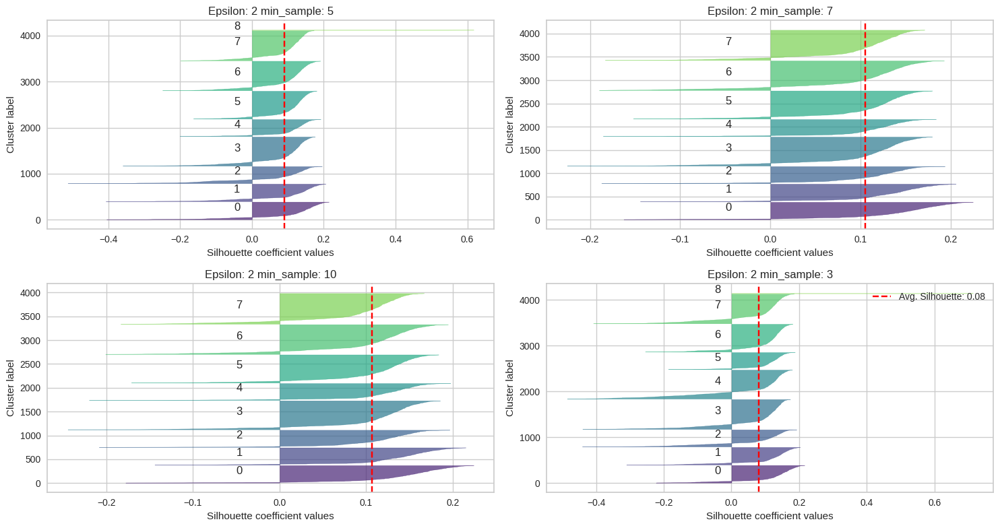

In [ ]:
# Set up subplots for Silhouette plots
fig, ax = plt.subplots(2, 2, figsize=(15, 8))
# Loop through different min_samples values
eps_list = [2]
min_samples_list = [3, 5, 7, 10]
parameters = [(eps,min_sample) for eps in eps_list for min_sample in min_samples_list]
for i, (epsilon,min_sample) in enumerate(parameters, start=1):
    q, mod = divmod(i, 2)

    # Fit DBSCAN
    model = DBSCAN(eps=epsilon, min_samples=min_sample)  # You can adjust min_samples as needed
    labels = model.fit_predict(loan)

    if(all(labels[x]==labels[0] for x in labels)):
      continue

    # Compute silhouette scores
    silhouette_vals = silhouette_samples(loan, labels)

    # Visualize silhouette scores
    y_lower = 10
    for cluster in set(labels):
        if cluster == -1:
            continue  # Skip outliers
        cluster_silhouette_vals = silhouette_vals[labels == cluster]
        cluster_silhouette_vals.sort()

        y_upper = y_lower + len(cluster_silhouette_vals)

        color = plt.cm.viridis(float(cluster + 1) / (len(set(labels)) + 1))  # Avoid division by zero
        ax[q-1][mod].fill_betweenx(np.arange(y_lower, y_upper),
                                   0, cluster_silhouette_vals,
                                   facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax[q-1][mod].text(-0.05, y_lower + 0.5 * len(cluster_silhouette_vals), str(cluster))

        # Compute the new y_lower for the next plot
        y_lower = y_upper + 10

    # Set labels and title for each subplot
    ax[q-1][mod].set_title(f'Epsilon: {epsilon} min_sample: {min_sample}')
    ax[q-1][mod].set_xlabel("Silhouette coefficient values")
    ax[q-1][mod].set_ylabel("Cluster label")

    # The vertical line for the average silhouette score of all the values
    avg_silhouette = silhouette_score(loan, labels)
    ax[q-1][mod].axvline(x=avg_silhouette, color="red", linestyle="--", label=f'Avg. Silhouette: {avg_silhouette:.2f}')

# Adjust layout and display the plot
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

In [ ]:
# Fit DBSCAN with optimal parameters and visualize clustering in 3D space using PCA
model = DBSCAN(eps=2, min_samples=10)
y = model.fit_predict(loan)
clusters = model.labels_
score = silhouette_score(loan, model.labels_)
db_score = davies_bouldin_score(loan, model.labels_)

print('Silhouette Score: %.3f' % score)
print('DB Score: %.3f' % db_score)

Silhouette Score: 0.107
DB Score: 2.524


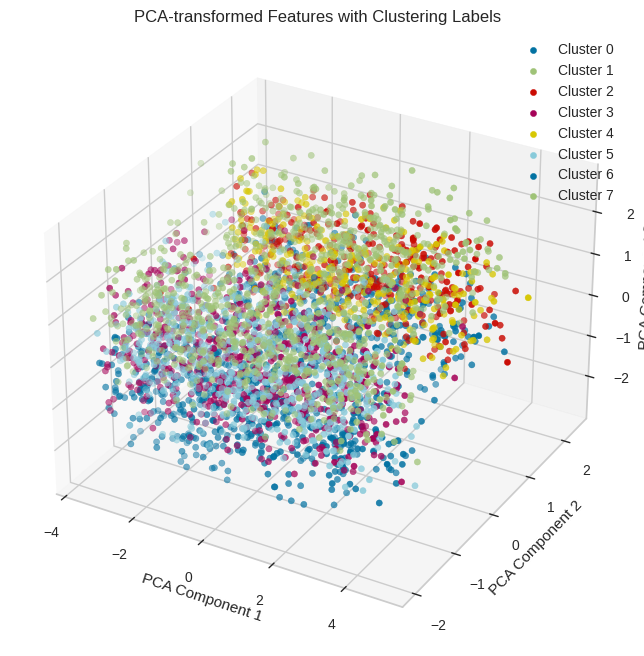

In [ ]:
# Scatter plot of the PCA-transformed features colored by clustering label
pca = PCA(n_components=3)
transformed_data = pca.fit_transform(loan)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of the PCA-transformed features colored by clustering label
for i in range(8):
    ax.scatter(transformed_data[clusters == i, 0],
               transformed_data[clusters == i, 1],
               transformed_data[clusters == i, 2],
               label=f'Cluster {i}')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('PCA-transformed Features with Clustering Labels')
ax.legend()

plt.show()

### Clustering Analysis Conclusion

Upon analyzing the clustering results using Hierarchical Clustering (HCL), KMeans, and DBSCAN, it is evident that both HCL and KMeans consistently suggest that the optimal number of clusters is 2. This conclusion aligns with the nature of our dataset, where loans are categorized as either approved or rejected.

#### KMeans: Optimal Fit for the Data

KMeans seems to be a more fitting algorithm for our data. It exhibits a slightly higher silhouette score, indicating better-defined and separated clusters. Moreover, the visualization of the silhouette reveals fewer points in ambiguous or overlapping regions, further emphasizing the effectiveness of KMeans in partitioning the data. The Davies-Bouldin Index (DBI) for KMeans is also lower than that of HCL, supporting the notion that KMeans provides more cohesive and well-defined clusters.

#### DBSCAN: Suboptimal Performance

In contrast, the results obtained from DBSCAN, despite exploring various combinations of epsilon and min_samples, were consistently less favorable compared to KMeans and HCL. This suggests that DBSCAN may not be well-suited for our dataset, possibly due to the relatively low number of rows (approximately 4000). The algorithm struggled to identify meaningful clusters and showed a tendency to label a significant portion of the data as outliers.